<a href="https://colab.research.google.com/github/alatieh/water_stable_isotopes/blob/main/Loobos_2022.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import the needed libraries

In [ ]:
%%capture
pip install windrose

In [ ]:
import requests
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.dates as mdates

from scipy.stats import zscore
import statsmodels.api as sm

from windrose import WindroseAxes

from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor

## Data wrangling

In [ ]:
# # here we will import the needed file from the SurfDrive
# # the CSV ( Teams file)

# url = "https://surfdrive.surf.nl/files/index.php/s/lD2YWll4gDdAtVU/download"
# filename = "LGR_Loobos_5_min_Calibrated.csv"

# response = requests.get(url, allow_redirects=True)

# if response.status_code == 200:
#     with open(filename, "wb") as f:
#         f.write(response.content)
# else:
#     print("Failed to download", url)

In [ ]:
# # Read the CSV from Teams
# Teams = pd.read_csv('LGR_Loobos_5_min_Calibrated.csv', parse_dates=['DATE_TIME'], index_col='DATE_TIME', dayfirst=True)

# # Adding a special column 'origin' with a value with a string value of 'original' to mark the orignal data
# Teams['origin'] = 'original'

In [ ]:
# # Resample and interpolate to create a regular time series
# Teams = Teams.resample('5T').interpolate(method='time', order=1)

# # There were 51799 rows in the imported
# # After interpolation we have 59146 rows, a measurment every 5 minutes

In [ ]:
# Teams['DATE_TIME'] = Teams.index # All in the format='%d/%m/%Y %H:%M'

# # Adding handy columns that I will use later to zoom in and out in the data
# Teams['month'] = Teams['DATE_TIME'].dt.month
# Teams['day'] = Teams['DATE_TIME'].dt.day
# Teams['hour'] = Teams['DATE_TIME'].dt.hour
# Teams['minutes'] = Teams['DATE_TIME'].dt.minute

# Teams['minute_of_day'] = (Teams['hour'] * 60) + Teams['minutes']

# Teams['day_of_year'] = Teams['DATE_TIME'].dt.dayofyear
# Teams['hour_of_year'] = (Teams['day_of_year'] * 24) + Teams['hour']
# Teams['minute_of_year'] = (Teams['hour_of_year'] * 60) + Teams['minutes']

# column_names = Teams.columns.tolist()

In [ ]:
#Teams.info()

In [ ]:
# # Read the extra CSV from      https://maq-observations.nl/operational-data/
# imported_extra = pd.read_csv('Loobos_extra.csv', parse_dates=['Timestamp'], index_col='Timestamp', skiprows=[1])

# # Display the first few rows of the imported_extra dataframe
# #imported_extra.head()

In [ ]:
# imported_extra_resampled = imported_extra.resample('5T').agg({'P_1_1_1': 'sum', 'SW_IN_1_1_1': 'mean', 'TA_1_1_1': 'mean' , 'RH_1_1_1': 'mean', 'WS_2_1_1': 'mean', 'WD_2_1_1': 'mean', 'PA_1_1_1': 'mean'})
# #imported_extra_resampled

In [ ]:
# imported_extra_resampled = imported_extra_resampled[:59146]
# #imported_extra_resampled

In [ ]:
# imported_extra_resampled.info()
# it must be same size as df  59146

In [ ]:
# df = pd.concat([Teams.reset_index(drop=True), imported_extra_resampled.reset_index(drop=True)], axis=1)

In [ ]:
# df.info()

In [ ]:
# df.rename(columns={'SW_IN_1_1_1': 'shortwave_in', 'TA_1_1_1': 'temp', 'RH_1_1_1': 'rh', 'WS_2_1_1': 'ws', 'WD_2_1_1': 'wd', 'PA_1_1_1': 'p', 'P_1_1_1': 'rain'}, inplace=True)

In [ ]:
# # Read the extra CO2 CSV from      https://maq-observations.nl/operational-data/
# CO2_data = pd.read_csv('Loobos co2.csv', parse_dates=['Timestamp'], index_col='Timestamp', skiprows=[1])

In [ ]:
# CO2_data = CO2_data.resample('5T').mean()

In [ ]:
# CO2_data = CO2_data[:59146]

In [ ]:
# CO2_data.info()

In [ ]:
# df = pd.concat([df.reset_index(drop=True), CO2_data.reset_index(drop=True)], axis=1)

In [ ]:
# df = df.drop(columns=['DH', 'GasP_torr', 'GasT_C', 'RD0_us', 'RD1_us', 'Gnd', 'LTC0_v', 'LTC1_v', 'R1a', 'R1b', 'R2', 'R3', 'R4', 'R2C', 'R4C', 'R3C', 'BL0T', 'BL1T', 'BL2F', 'BL3F', 'H2O18_8_CT', 'H2O18_8_AT', 'H2O18_8_DF', 'H2O18_8_PT', 'H2Oa_10_CT', 'H2Oa_10_AT', 'H2Oa_10_DF', 'H2Oa_10_PT', 'HOD_11_CT', 'HOD_11_AT', 'HOD_11_DF', 'HOD_11_PF', 'BL0T_B', 'BL1T_B', 'BL2F_B', 'BL3F_B', 'H2Ob_10_CT_B', 'H2Ob_10_AT_B', 'H2Ob_10_DF_B', 'H2Ob_10_PF_B', 'H2O17_14_CT_B', 'H2O17_14_AT_B', 'H2O17_14_DF_B', 'H2O17_14_PF_B', 'Fit_Flag', 'MIU_VALVE'])

In [ ]:
# # dropping the   N_Fits_Avg'd   column
# df = df.drop(columns=[df.columns[6]])

In [ ]:
# def dew_point(temperature, relative_humidity):
#     # Constants for the Magnus formula
#     a = 17.27
#     b = 237.7

#     # Magnus formula for dew point
#     alpha = ((a * temperature) / (b + temperature)) + np.log(relative_humidity / 100.0)
#     dewpoint = (b * alpha) / (a - alpha)

#     return dewpoint

# df['Tdew'] = dew_point(df['temp'], df['rh'])

In [ ]:
# df['Temp_min_Tdew'] = df['temp'] - df['Tdew']

In [ ]:
# # Keeping only the original data
# df = df[df['origin'] == 'original']

In [ ]:
# df.set_index('DATE_TIME', inplace=True)

In [ ]:
# df.info()

In [ ]:
# # Investigate the max and min values of the column 'WVISS_VOLTAGE'
# max_value = df['WVISS_VOLTAGE'].max()
# min_value = df['WVISS_VOLTAGE'].min()

# max_value, min_value

We have a tip that the WVISS_VOLTAGE is the parameter that makes an orofice open to guide the dry air stream.  
`WVISS_VOLTAGE` should be one of the variables which changes dependent on the calibrations running or not

The provided values serve as evidence that calibration values have been `already` removed. Well done!

In [ ]:
# df.drop(columns=['WVISS_VOLTAGE', 'origin'], inplace=True)

In [ ]:
# df.to_csv('df.csv')

## Investigate the data

In [ ]:
url = "https://raw.githubusercontent.com/alatieh/water_stable_isotopes/data/df.csv"
df = pd.read_csv(url, parse_dates=['DATE_TIME'], index_col='DATE_TIME', dayfirst=True)

column_names = df.columns.tolist()

In [ ]:
# # here we will import the result of our Data wrangling

# url = "https://surfdrive.surf.nl/files/index.php/s/Bot2GbRFRAkb8cS/download"
# filename = "df.csv"

# response = requests.get(url, allow_redirects=True)

# if response.status_code == 200:
#     with open(filename, "wb") as f:
#         f.write(response.content)
# else:
#     print("Failed to download", url)

In [ ]:
# df = pd.read_csv('df.csv', parse_dates=['DATE_TIME'], index_col='DATE_TIME', dayfirst=True)

# column_names = df.columns.tolist()

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 51799 entries, 2022-05-01 00:00:00 to 2022-11-22 08:45:00
Data columns (total 32 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   H2O              51799 non-null  float64
 1   Delta_18_16      51799 non-null  float64
 2   Delta_D_H        51799 non-null  float64
 3   Delta_17_16      51799 non-null  float64
 4   O18O16           51799 non-null  float64
 5   O17O16           51799 non-null  float64
 6   CDelta_17O       51799 non-null  float64
 7   CDelta_D         51799 non-null  float64
 8   Delta_D_H_cal    51799 non-null  float64
 9   Delta_18_16_cal  51799 non-null  float64
 10  Delta_17_16_cal  51799 non-null  float64
 11  CDelta_17O_cal   51799 non-null  float64
 12  CDelta_D_cal     51799 non-null  float64
 13  month            51799 non-null  int64  
 14  day              51799 non-null  int64  
 15  hour             51799 non-null  int64  
 16  minutes          51799 

| Short Name                   | Unit            |  Long Name      |
|--------------|------------------------|-----------------|
| `shortwave_in` | W m-2                  | incoming shortwave
| `temp`         | °C                     | Dry bulb temperature unventilated (2 m)  
| `Temp_min_Tdew`         | °C                     | Difference between air temperature and the Dew temperature   
| `rh`           | %                      | Relative humidity (2 m)  
| `ws`           | m s-1                  | Wind speed cup 10m mean    
| `wd`           | °                      | Wind direction sonic 2m  
| `p`            | kPa                    | Air pressure         
| `rain`         | mm                     | Realtime if > 0.1 mm/min. For rain warning only, not for daily totals. For actual precipitation use P_1_1_7. |
| `CO2`          | µmol mol-1             | co2_mole_fraction                         
| `H2O`          | mumol /mol  or ppm             | H2O molefraction
| `CDelta_D_cal`  | ‰             | Δ D = δD -8 * δ18O  





In [ ]:
# We will investigate the dirunal cycle of D_H  & O18
D_H = 'Delta_D_H_cal'
O18 = 'Delta_18_16_cal'

In [ ]:
print('The data have a range from', df.index.min(),'to',df.index.max(), '\n',
      'which is', df.iloc[-1]['day_of_year'] - df.iloc[0]['day_of_year'],'days', '\n',
      'The frequency is' , df.index.freq)

The data have a range from 2022-05-01 00:00:00 to 2022-11-22 08:45:00 
 which is 205.0 days 
 The frequency is None


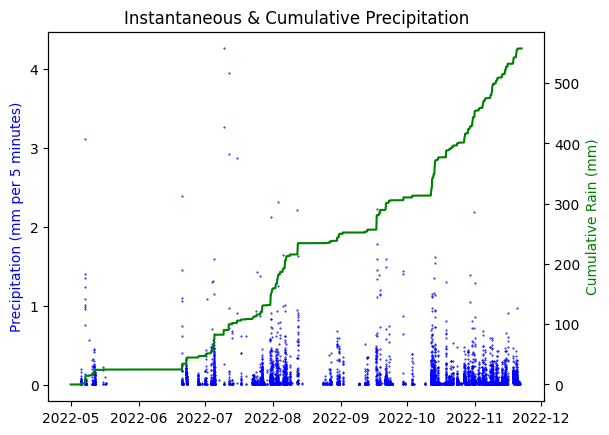

In [ ]:
# Filter out points with value zero rain for neat plot
filtered_data = df[df['rain'] != 0]

# Calculate the cumulative sum of precipitation
cumulative_rain = df['rain'].cumsum()

fig, ax1 = plt.subplots()

ax1.scatter(filtered_data.index, filtered_data['rain'], s=0.2, color='b')
ax1.set_ylabel('Precipitation (mm per 5 minutes)', color='b')

# Create a secondary y-axis for cumulative rain
ax2 = ax1.twinx()
ax2.plot(df.index, cumulative_rain, color='green')
ax2.set_ylabel('Cumulative Rain (mm)', color='green')

plt.title('Instantaneous & Cumulative Precipitation')
plt.show()

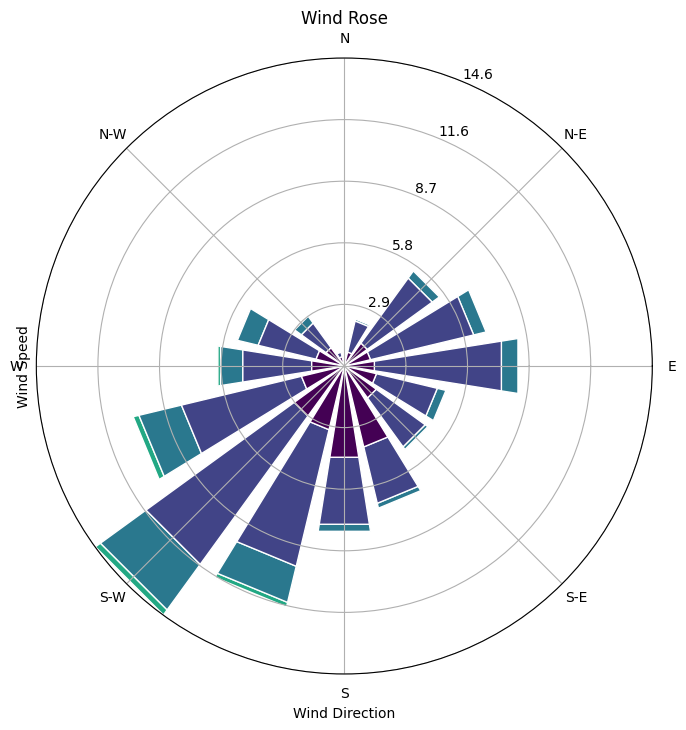

In [ ]:
# Create a new figure and axis
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw={'projection': 'windrose'})

# Plot the wind rose
ax.bar(df['wd'], df['ws'], normed=True, opening=0.8, edgecolor='white')

# Set the title and labels
ax.set_title('Wind Rose')
ax.set_xlabel('Wind Direction')
ax.set_ylabel('Wind Speed')

# Show the wind rose
plt.show()

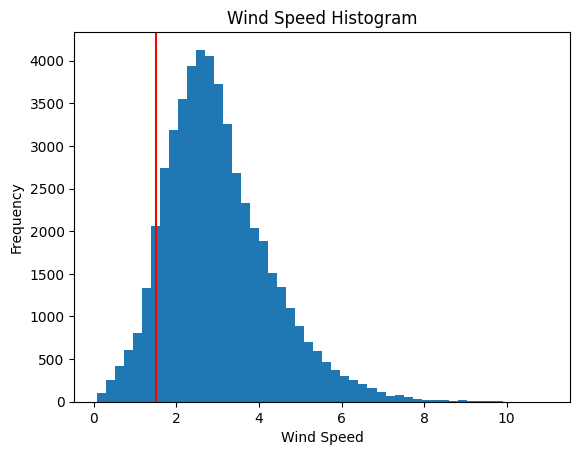

In [ ]:
# Create a histogram of wind speed
plt.hist(df['ws'], bins=50)

# Add a vertical line at x = 1.5
plt.axvline(x=1.5, color='red')

# Set the title and labels
plt.title('Wind Speed Histogram')
plt.xlabel('Wind Speed')
plt.ylabel('Frequency')

# Show the histogram
plt.show()

# Plots

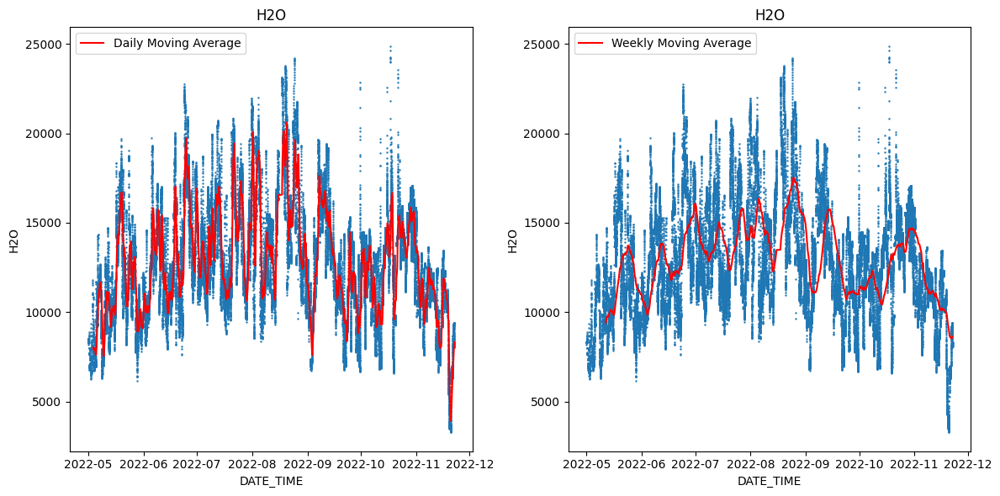

In [ ]:
def EasyPlot(column_name, df=None):
    """
    This function will make a scatter plot for all measurements
    The first figure will be with daily moving average in red line
    The second figure will be with weekly moving average in red line

    Parameters:
    column_name (str): The name of the column to plot.
    data (pd.DataFrame, optional): The data to use for plotting. If not provided, it will use the 'data' variable defined in the environment.
    """
    if df is None:
        df = globals().get('df')

    column_index = column_names.index(column_name)

    daily_moving_average = df[column_name].rolling(window=288).mean()
    weekly_moving_average = df[column_name].rolling(window=2016).mean()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.scatter(df.index, df[column_name], s=0.5)
    plt.plot(df.index, daily_moving_average, color='red', label='Daily Moving Average')
    plt.xlabel('DATE_TIME')
    plt.ylabel(column_names[column_index])
    plt.title(column_name)
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.scatter(df.index, df[column_name], s=0.5)
    plt.plot(df.index, weekly_moving_average, color='red', label='Weekly Moving Average')
    plt.xlabel('DATE_TIME')
    plt.ylabel(column_names[column_index])
    plt.title(column_name)
    plt.legend()

    plt.tight_layout()
    plt.show()

# Example
EasyPlot('H2O')

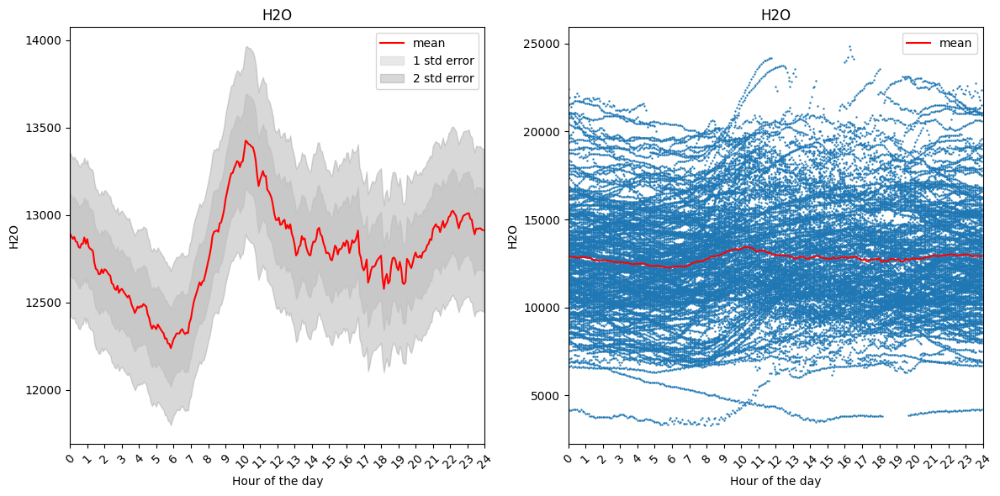

In [ ]:
def DailyPlot(selected, df = None):
    """
    function that take the data and make two neat daily plot
    It works in steps:
        - Group measurments by the minute of the day

        In the first plot
            - Plot it nicely as a line with the hour of the day on the x-axis and the variable on the y-axis
            - The data plotted is the the mean value of that time; the mean value of all measurment at that minute of the day
        In the second plot
            - it will add a scatter plot in blue for all individual values minutes (in addtion to the mean in red)

    Parameters:
    column_name (str): The name of the column to plot.
    data (pd.DataFrame, optional): The data to use for plotting. If not provided, it will use the 'data' variable defined in the environment.
    """

    if df is None:
        df = globals().get('df')

    grouped_data = df.groupby(df['minute_of_day'])[selected].mean()
    std_error = df.groupby(df['minute_of_day'])[selected].std() / np.sqrt(df.groupby(df['minute_of_day'])[selected].count())

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(grouped_data.index, grouped_data.values, color='red', label='mean')
    plt.fill_between(grouped_data.index, grouped_data.values - std_error, grouped_data.values + std_error, color='lightgray', alpha=0.5, label='1 std error')
    plt.fill_between(grouped_data.index, grouped_data.values - 2*std_error, grouped_data.values + 2*std_error, color='gray', alpha=0.3, label='2 std error')
    plt.xlabel('Hour of the day')
    plt.ylabel(selected)
    plt.xlim(0, 1440)
    plt.xticks(range(0, 1441, 60), range(0, 25), rotation=45)
    plt.legend()
    plt.title(selected)

    plt.subplot(1, 2, 2)
    plt.plot(grouped_data.index, grouped_data.values, color='red', label='mean')
    plt.scatter(df['minute_of_day'], df[selected], s=0.5)
    plt.xlabel('Hour of the day')
    plt.ylabel(selected)
    plt.xlim(0, 1440)
    plt.xticks(range(0, 1441, 60), range(0, 25), rotation=45)
    plt.legend()
    plt.title(selected)

    plt.tight_layout()
    plt.show()

# Example
DailyPlot('H2O')

The H2O reaching a value of 5000 ppm (=0.5%) is **not** an outlier. It is a realistic value that can result from cold weather.  

I had the same resulte  
using   https://www.orslabs.fr/en/tools/moisture-calculator/   
with RH of 70% and T of 3

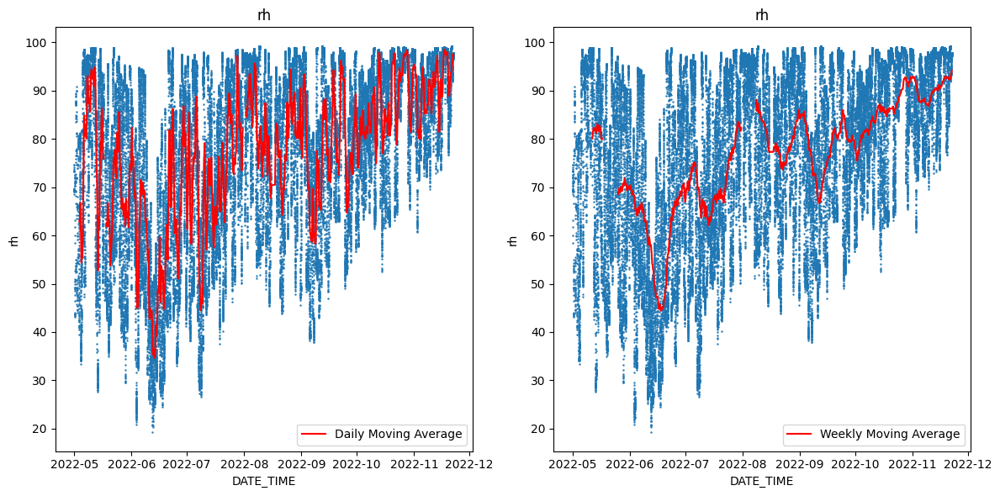

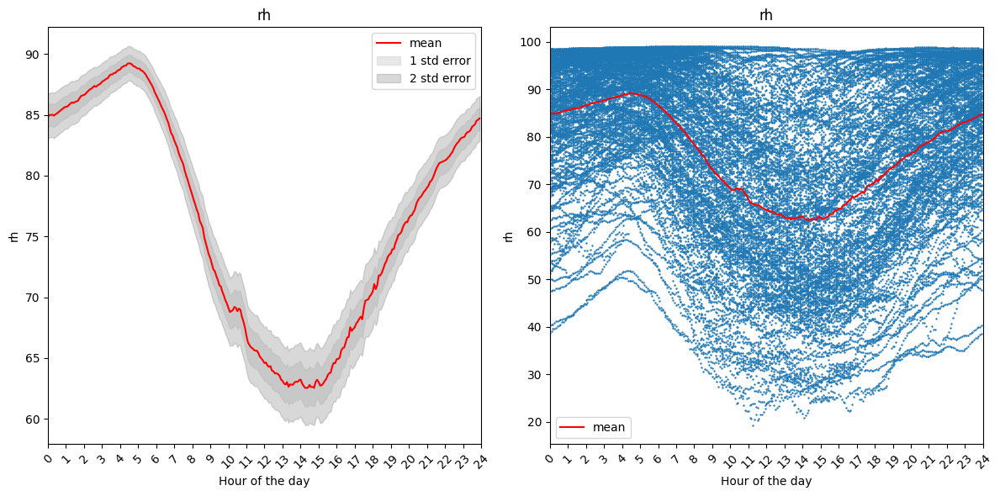

In [ ]:
EasyPlot('rh')
DailyPlot('rh')

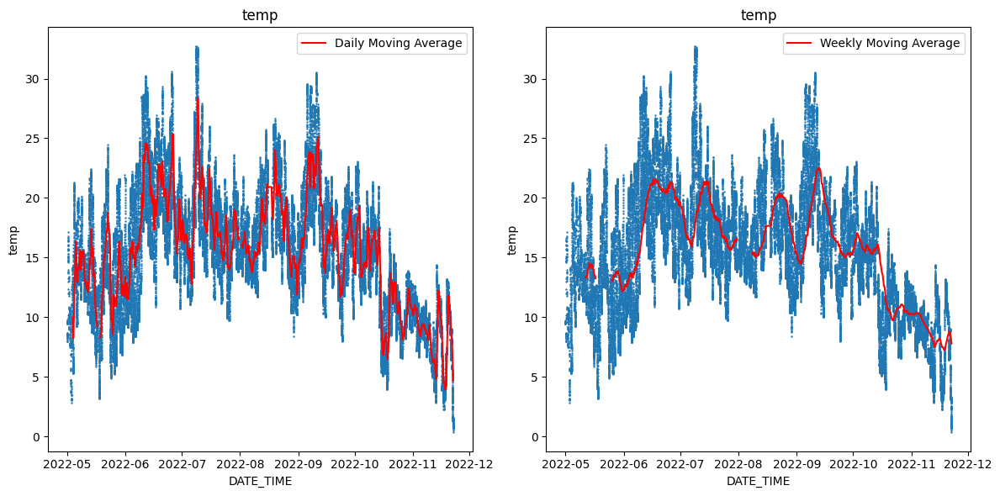

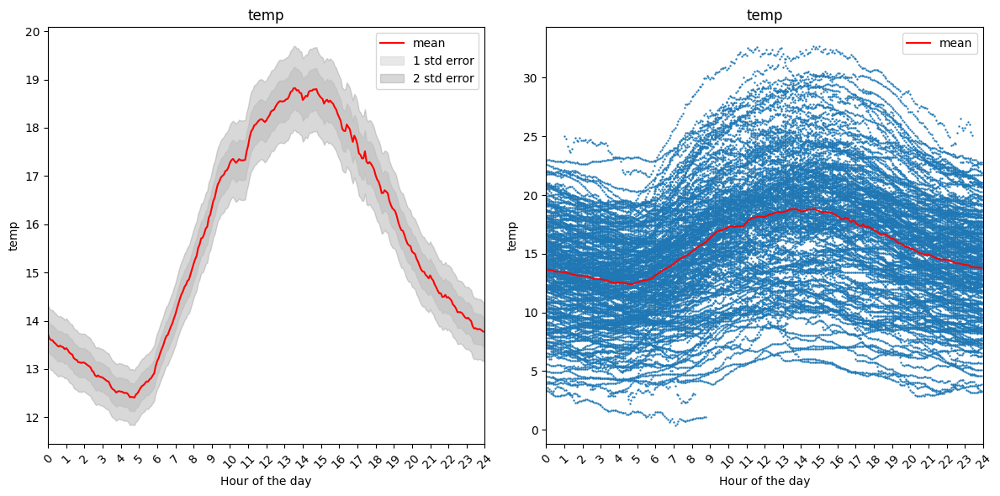

In [ ]:
EasyPlot('temp')
DailyPlot('temp')

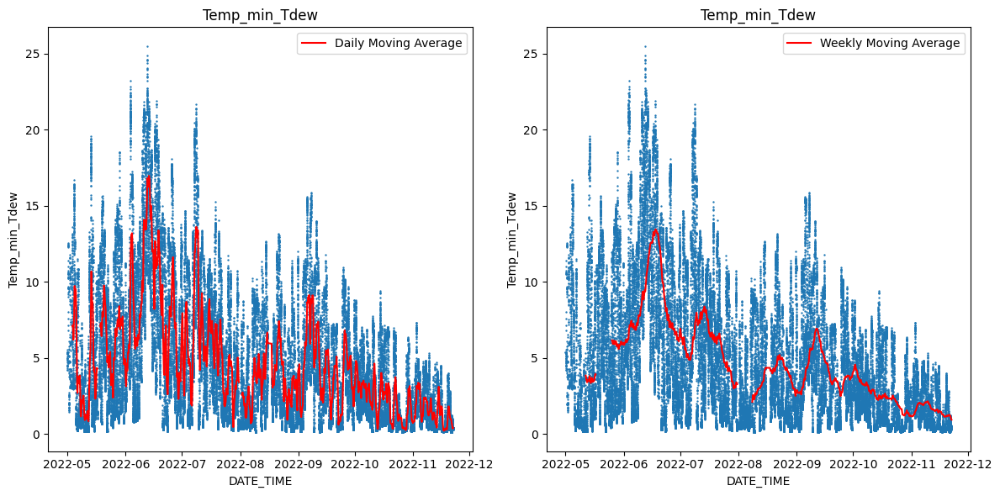

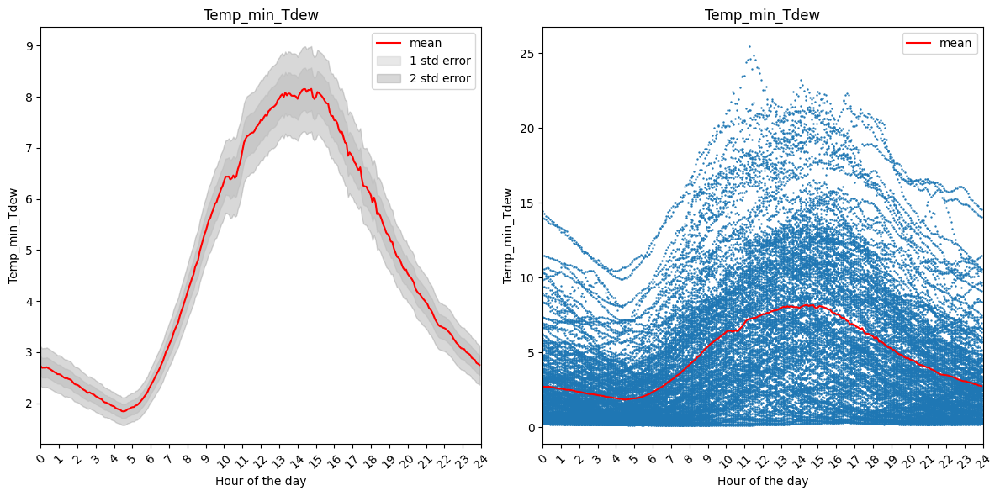

In [ ]:
EasyPlot('Temp_min_Tdew')
DailyPlot('Temp_min_Tdew')

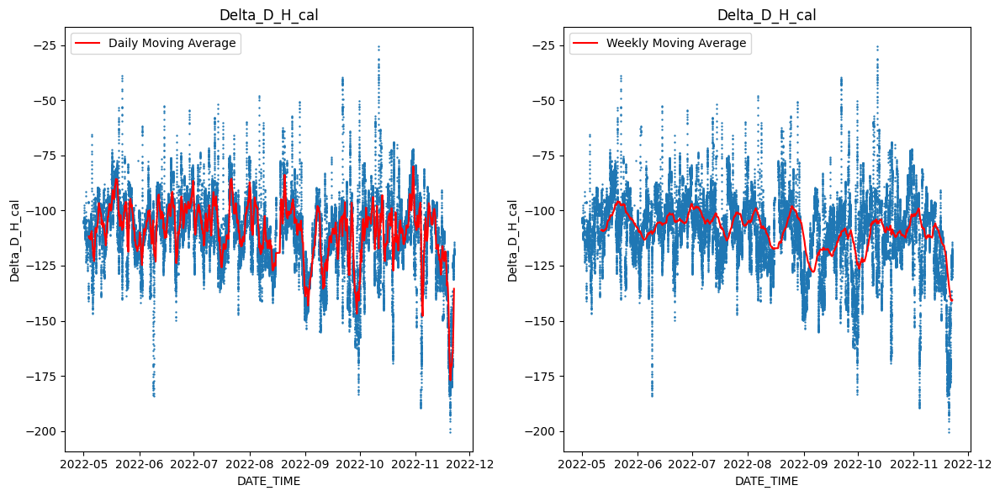

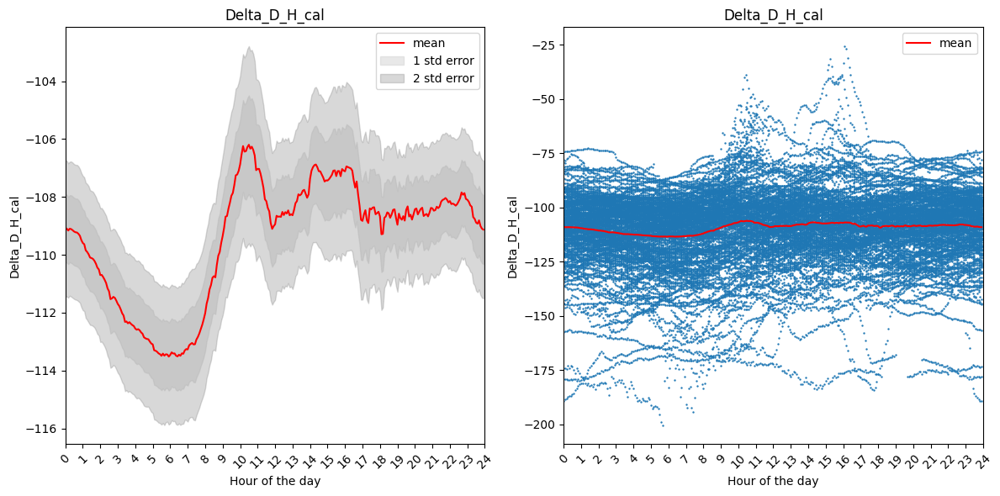

In [ ]:
EasyPlot('Delta_D_H_cal')
DailyPlot('Delta_D_H_cal')

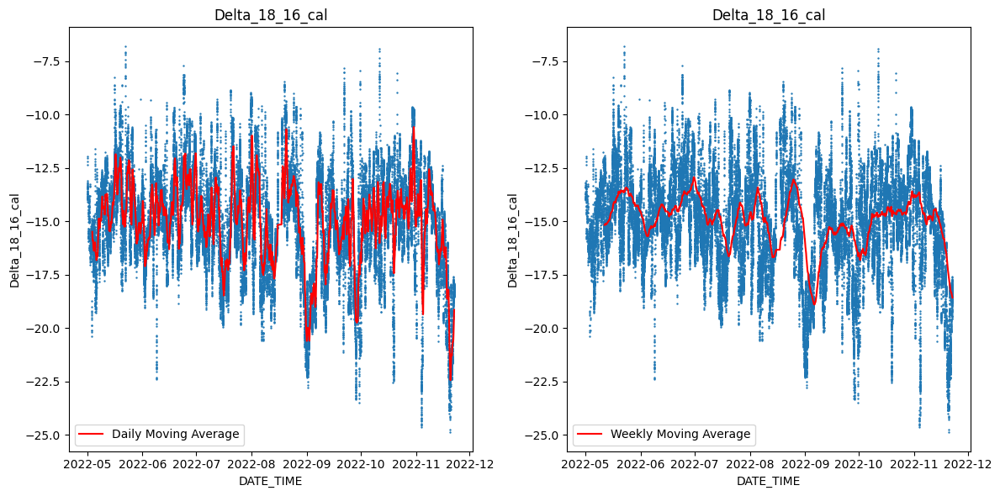

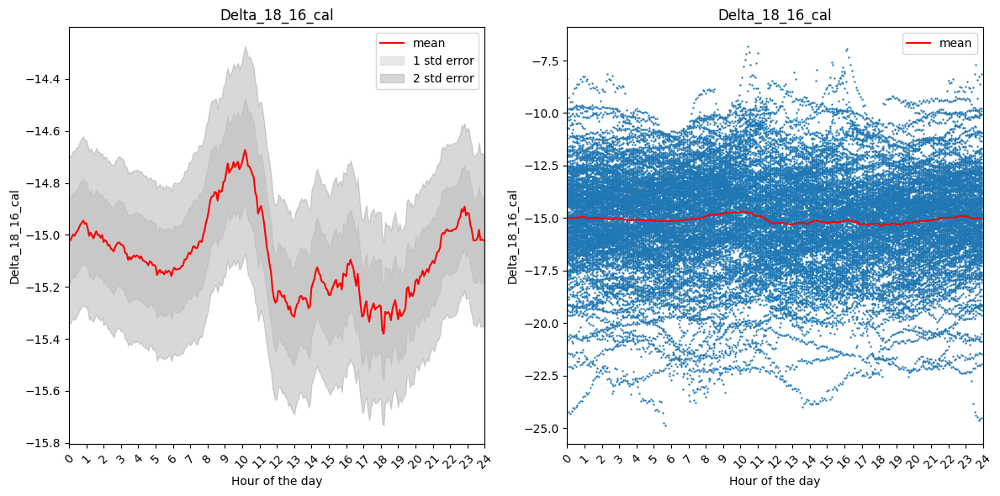

In [ ]:
EasyPlot('Delta_18_16_cal')
DailyPlot('Delta_18_16_cal')

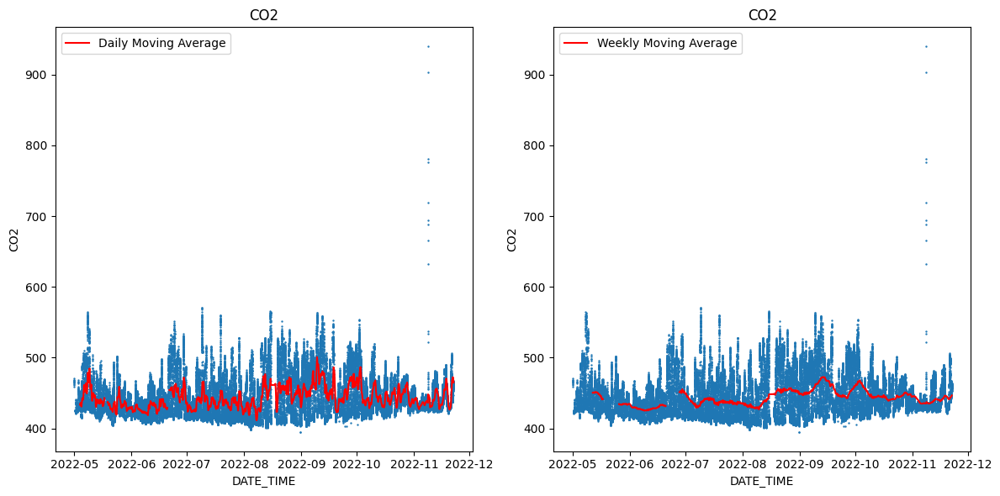

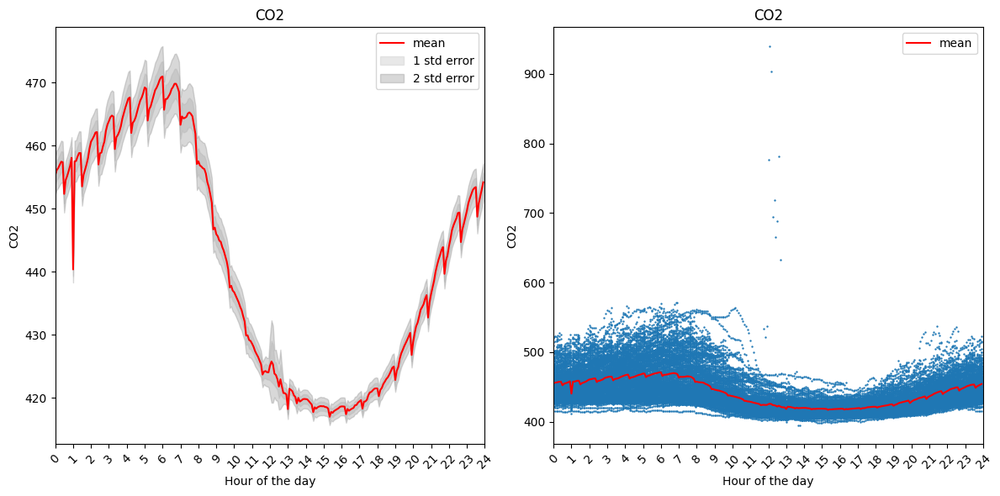

In [ ]:
EasyPlot('CO2')
DailyPlot('CO2')

I think that the high CO2 value of 2023-11-08 is wildfire or technical problems

I have no explanation for the high frequency CO2 cycles (less than an hour). Maybe data noise?

We could take the derivative of CO2 to determine the photosynthesis points. During these measurements, there is water evapotranspiration. Conifers have almost no evapotranspiration at night according to Caird et al. [2007]([url](https://academic.oup.com/plphys/article/143/1/4/6106731))—> no isotopic signal from evapotranspiration

# Fit to detect calibration

In [ ]:
def fit(x, y):
    title = f"Linear fit between '{x}' vs '{y}'"

    coefficients = np.polyfit(df[x], df[y], 1)

    sign = '+' if coefficients[1] >= 0 else '-'
    fit_equation = f" {y} = {round(coefficients[0], 4)} x {x} {sign} {abs(round(coefficients[1], 4))}"
    print('fit equation is', fit_equation)

    correlation_matrix = np.corrcoef(df[x], df[y])
    r_value = correlation_matrix[0, 1]
    print('R value is', round(r_value, 3))

    plt.scatter(df[x], df[y], s=0.5)
    plt.plot(df[x], np.polyval(coefficients, df[x]), color='red', label='Fit')
    plt.xlabel(x)
    plt.ylabel(y)
    plt.title(title)
    plt.legend()
    plt.show()

fit equation is  Delta_D_H_cal = 0.9963 x Delta_D_H + 2.7523
R value is 0.997


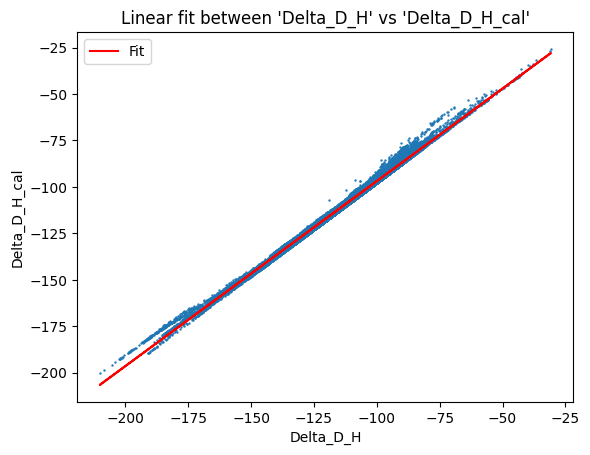

In [ ]:
fit('Delta_D_H', 'Delta_D_H_cal')

fit equation is  Delta_18_16_cal = 0.9858 x Delta_18_16 - 0.3204
R value is 0.997


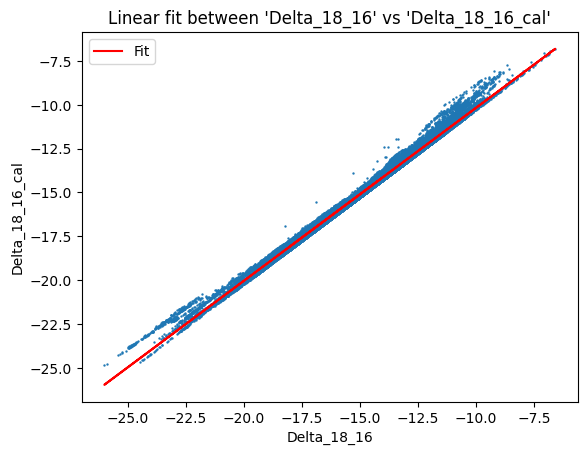

In [ ]:
fit('Delta_18_16', 'Delta_18_16_cal')

# Correlation between The data and the isotopes

## First: The Correlation between The two studied isotopes `Delta_18_16_cal` and the `Delta_D_H_cal`

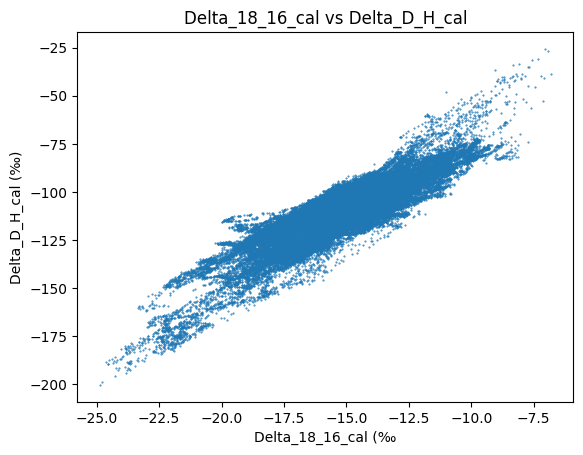

In [ ]:
plt.scatter(df['Delta_18_16_cal'], df['Delta_D_H_cal'], s=0.2)
plt.xlabel('Delta_18_16_cal (‰')
plt.ylabel('Delta_D_H_cal (‰)')
plt.title('Delta_18_16_cal vs Delta_D_H_cal')
plt.show()

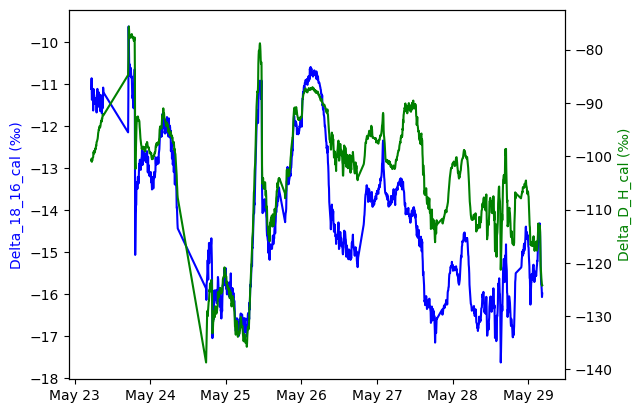

In [ ]:
fig, ax1 = plt.subplots()

x = 5000
y = x + 1440

ax1.plot(df['Delta_18_16_cal'][x:y], color='blue')
ax1.set_ylabel('Delta_18_16_cal (‰)', color='blue')

ax2 = ax1.twinx()
ax2.plot(df['Delta_D_H_cal'][x:y], color='green')
ax2.set_ylabel('Delta_D_H_cal (‰)', color='green')

# Set the x-axis ticks to show only the month name and day number
ax1.xaxis.set_major_locator(mdates.DayLocator())
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%b %d'))

plt.show()

In [ ]:
correlation = df['Delta_18_16_cal'].corr(df['Delta_D_H_cal'])
correlation

0.8899311586014237

## Correlation between Relative Humidity `rh` and the isotopes

In the following lines, we will investigate whether there is a correlation between 'H2O' and the isotopes.

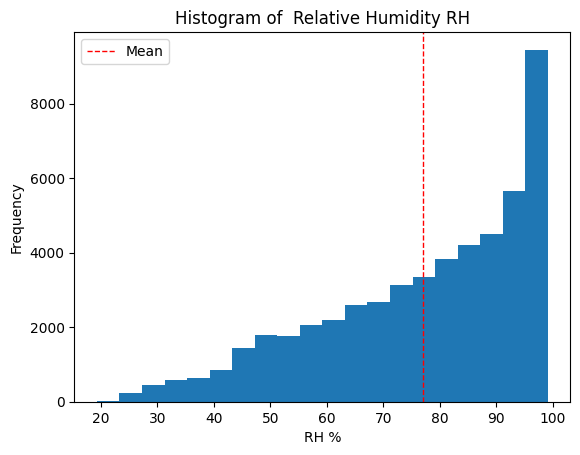

In [ ]:
# first plotting the water values
plt.hist(df['rh'], bins=20)
plt.axvline(df['rh'].mean(), color='red', linestyle='dashed', linewidth=1)
plt.xlabel('RH %')
plt.ylabel('Frequency')
plt.title('Histogram of  Relative Humidity RH')
plt.legend(['Mean'])
plt.show()

It is not gaussian distribution and did not cover the whole year.  

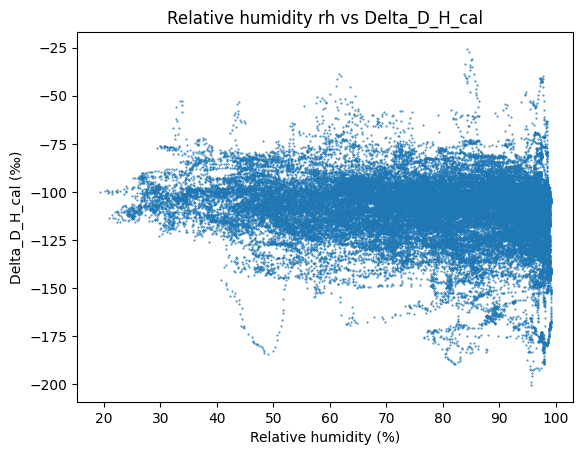

In [ ]:
plt.scatter(df['rh'], df['Delta_D_H_cal'], s=0.2)
plt.xlabel('Relative humidity (%)')
plt.ylabel('Delta_D_H_cal (‰)')
plt.title('Relative humidity rh vs Delta_D_H_cal')
plt.show()

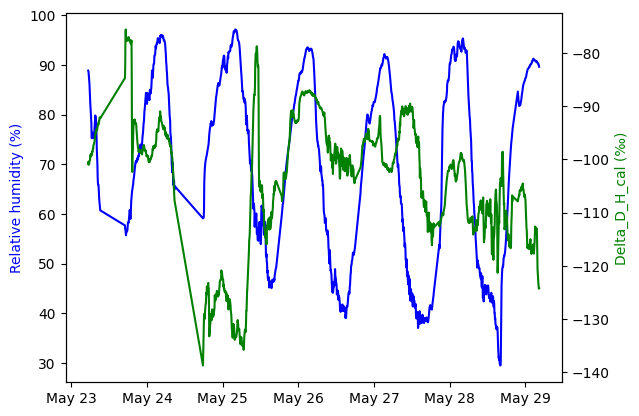

In [ ]:
fig, ax1 = plt.subplots()

x = 5000
y = x + 1440

ax1.plot(df['rh'][x:y], color='blue')
ax1.set_ylabel('Relative humidity (%)', color='blue')

ax2 = ax1.twinx()
ax2.plot(df['Delta_D_H_cal'][x:y], color='green')
ax2.set_ylabel('Delta_D_H_cal (‰)', color='green')

# Set the x-axis ticks to show only the month name and day number
ax1.xaxis.set_major_locator(mdates.DayLocator())
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%b %d'))

plt.show()

In [ ]:
correlation = df['rh'].corr(df['Delta_D_H_cal'])
correlation

-0.17776958128464496

## Correlation between `Temp_min_Tdew` and the isotopes  



`Temp_min_Tdew` is the Difference between air temperature and the Dew temperature

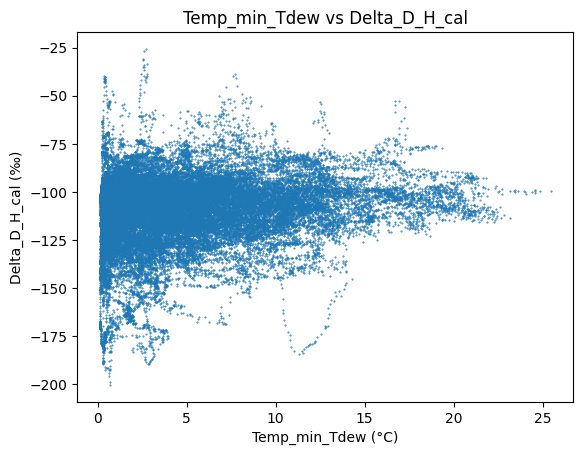

In [ ]:
plt.scatter(df['Temp_min_Tdew'], df['Delta_D_H_cal'], s=0.2)
plt.xlabel('Temp_min_Tdew (°C)')
plt.ylabel('Delta_D_H_cal (‰)')
plt.title('Temp_min_Tdew vs Delta_D_H_cal')
plt.show()

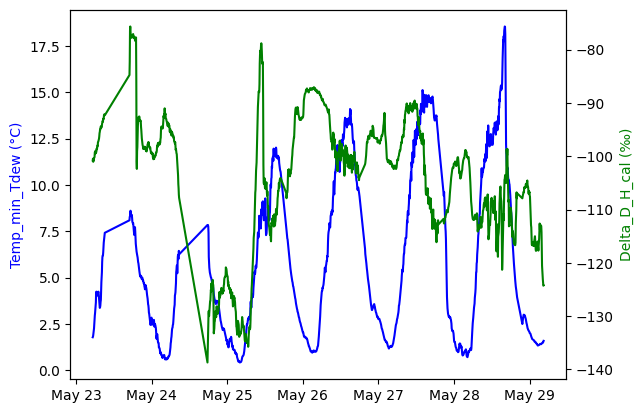

In [ ]:
fig, ax1 = plt.subplots()

x = 5000
y = x + 1440

ax1.plot(df['Temp_min_Tdew'][x:y], color='blue')
ax1.set_ylabel('Temp_min_Tdew (°C)', color='blue')

ax2 = ax1.twinx()
ax2.plot(df['Delta_D_H_cal'][x:y], color='green')
ax2.set_ylabel('Delta_D_H_cal (‰)', color='green')

# Set the x-axis ticks to show only the month name and day number
ax1.xaxis.set_major_locator(mdates.DayLocator())
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%b %d'))

plt.show()

In [ ]:
correlation = df['Temp_min_Tdew'].corr(df['Delta_D_H_cal'])
correlation

0.1699230112831607

## Correlation between `H2O` and the isotopes  

fit equation is  Delta_D_H_cal = 0.0028 x H2O - 145.9945
R value is 0.536


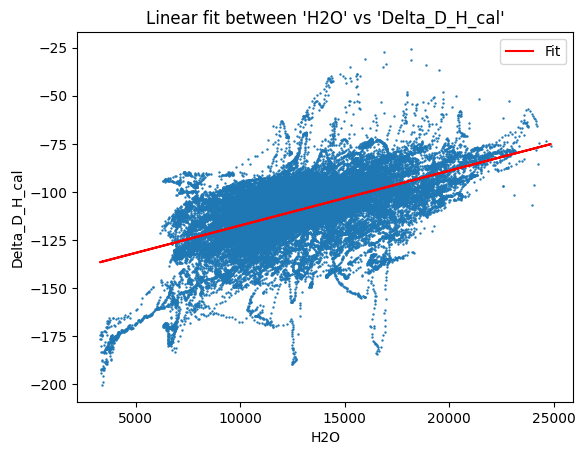

In [ ]:
fit('H2O', 'Delta_D_H_cal')

fit equation is  Delta_18_16_cal = 0.0004 x H2O - 20.7399
R value is 0.601


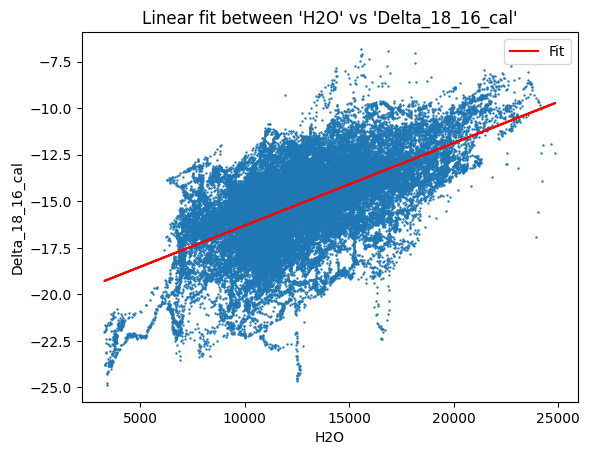

In [ ]:
fit('H2O', 'Delta_18_16_cal')

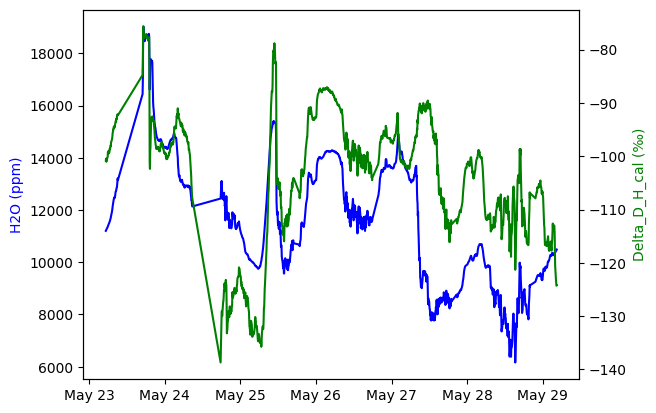

In [ ]:
fig, ax1 = plt.subplots()

x = 5000
y = x + 1440

ax1.plot(df['H2O'][x:y], color='blue')
ax1.set_ylabel('H2O (ppm)', color='blue')

ax2 = ax1.twinx()
ax2.plot(df['Delta_D_H_cal'][x:y], color='green')
ax2.set_ylabel('Delta_D_H_cal (‰)', color='green')

# Set the x-axis ticks to show only the month name and day number
ax1.xaxis.set_major_locator(mdates.DayLocator())
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%b %d'))

plt.show()

In [ ]:
correlation = df['H2O'].corr(df['Delta_D_H_cal'])
correlation

0.5359258099671198

An R value of `0.604` indicates that `60%` of the variation in the data can be explained by the water value.

## Correlation between temperature `temp` and the isotopes  

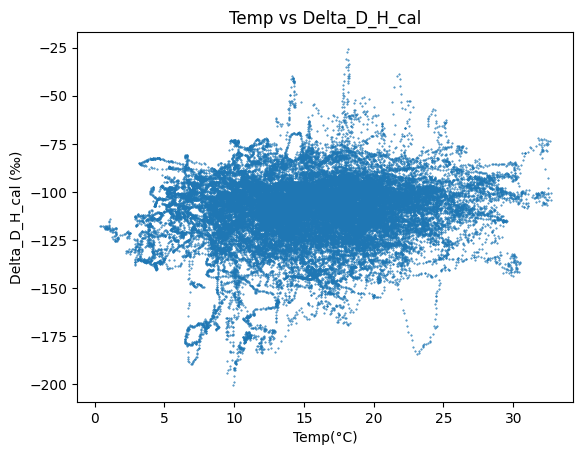

In [ ]:
plt.scatter(df['temp'], df['Delta_D_H_cal'], s=0.2)
plt.xlabel('Temp(°C)')
plt.ylabel('Delta_D_H_cal (‰)')
plt.title('Temp vs Delta_D_H_cal')
plt.show()

In [ ]:
correlation = df['temp'].corr(df['Delta_D_H_cal'])
correlation

0.13500458984361552

## Check other possible correlation between the data and the isotopes  

In [ ]:
# Calculate the correlation between each column in the dataframe and the 'Delta_D_H_cal' column
correlations = df.corr()['Delta_D_H_cal']

# Remove the correlation between 'Delta_D_H_cal' and itself and the uncalibrated value isotopes
correlations = correlations.drop(['Delta_D_H_cal', 'Delta_D_H', 'Delta_18_16_cal', 'Delta_18_16', 'hour', 'minute_of_day',
                                  'day'])

# Sort the correlations in descending order
correlations = correlations.sort_values(ascending=False)

correlations

Delta_17_16_cal    0.926354
O18O16             0.895835
Delta_17_16        0.866909
O17O16             0.866908
H2O                0.535926
CDelta_17O_cal     0.259079
Temp_min_Tdew      0.169923
temp               0.135005
shortwave_in       0.112278
p                  0.040753
ws                 0.033105
CDelta_D_cal       0.025060
moving_avg         0.024819
minutes           -0.001080
wd                -0.003010
rain              -0.004033
Tdew              -0.008612
CDelta_D          -0.012001
CO2               -0.142579
rh                -0.177770
CDelta_17O        -0.177899
hour_of_year      -0.263567
minute_of_year    -0.263567
day_of_year       -0.263938
month             -0.269900
Name: Delta_D_H_cal, dtype: float64

The highest value is with `H2O`

We have a positive correlation of (0.11) with `shortwave_in`. Which can be explained that the isotopes value is higher in the day time.  

We have a negative correlation of (-0.14) with `CO2`. Which can be explained that the isotopes value is lower in the night time.

The negative correlation value (-0.26) for the time indicates a decline in the value through the time. This correlation could be resulted because we have less than one year which is less than one meteorological cycle. Our time periode begin in the month May and end in October.

# Slicing

## Two slices based on the `RH` value

In the subsequent lines, we will partition the data into ten slices based on the `RH` value. Subsequently, we will examine the diurnal cycle of isotopes within each slice.

In [ ]:
# Calculate the daily mean value of H2O and store it in a new column
df['RH_daily_mean'] = df.groupby('day_of_year')['rh'].transform('mean')

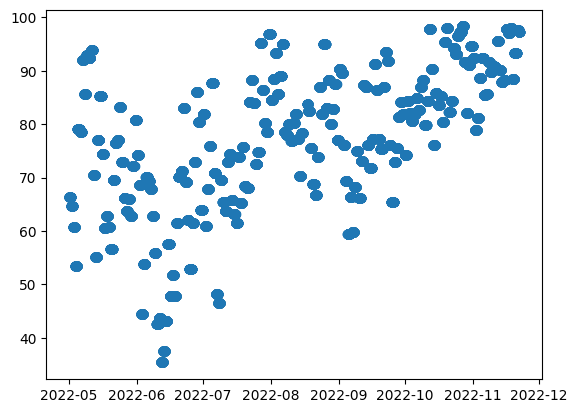

In [ ]:
plt.scatter(df.index, df['RH_daily_mean'])

In [ ]:
unique_values = df['RH_daily_mean'].nunique()
unique_values

205

In [ ]:
unique_values = df['day_of_year'].nunique()
unique_values

205

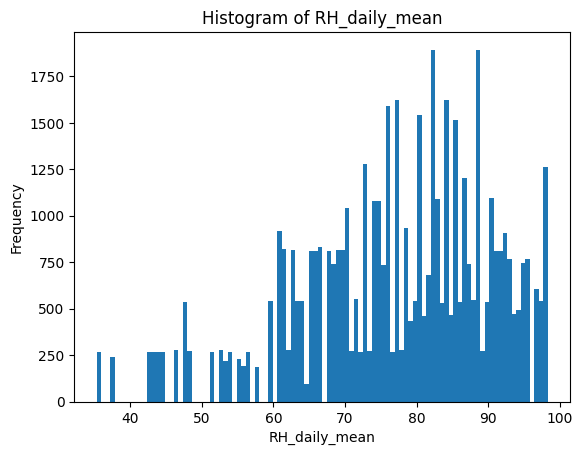

In [ ]:
plt.hist(df['RH_daily_mean'], bins=100)
plt.xlabel('RH_daily_mean')
plt.ylabel('Frequency')
plt.title('Histogram of RH_daily_mean')
plt.show()

In [ ]:
df['RH_daily_mean'].max()

98.31372839506172

In [ ]:
df['RH_daily_mean'].min()

35.36741542288557

In [ ]:
num = 2 # number of the wanted slice's

# Divide data['rh'] into 2 equal classes
classes = pd.qcut(df['RH_daily_mean'], q=num)
classes

DATE_TIME
2022-05-01 00:00:00    (35.366, 78.575]
2022-05-01 00:05:00    (35.366, 78.575]
2022-05-01 00:10:00    (35.366, 78.575]
2022-05-01 00:15:00    (35.366, 78.575]
2022-05-01 00:20:00    (35.366, 78.575]
                             ...       
2022-11-22 08:25:00    (78.575, 98.314]
2022-11-22 08:30:00    (78.575, 98.314]
2022-11-22 08:35:00    (78.575, 98.314]
2022-11-22 08:40:00    (78.575, 98.314]
2022-11-22 08:45:00    (78.575, 98.314]
Name: RH_daily_mean, Length: 51799, dtype: category
Categories (2, interval[float64, right]): [(35.366, 78.575] < (78.575, 98.314]]

In [ ]:
classes.cat.categories[0]

Interval(35.366, 78.575, closed='right')

In [ ]:
classes.cat.categories[0].left

35.366

In [ ]:
classes.cat.categories[(num-1)].right

98.314

In [ ]:
# Create ten sub-datasets based on the classes
sub_datasets = []
for i in range(num):
    sub_dataset = df[classes == classes.cat.categories[i]]
    sub_datasets.append(sub_dataset)

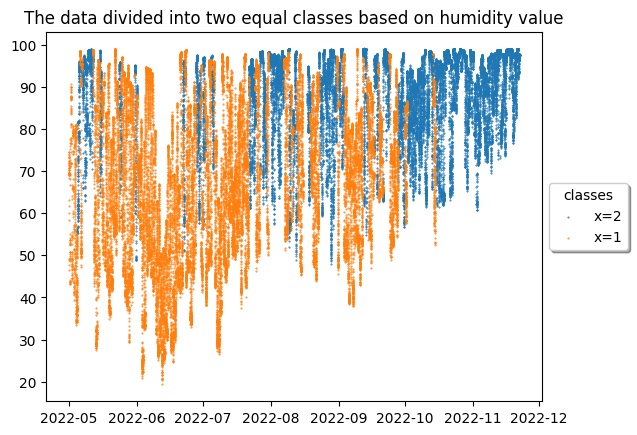

In [ ]:
# Create a figure and axis object
fig, ax = plt.subplots()

# Loop through the values of classes (0 to  num-1 )
for x in range((num-1), -1, -1):
    # Plot the scatter for each sub_dataset
    ax.scatter(sub_datasets[x].index, sub_datasets[x]['rh'], label=f'x={x+1}', s =0.2)

# Add a legend on the right and reverse the order
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), title='classes', fancybox=True, shadow=True)

# Add a title
ax.set_title('The data divided into two equal classes based on humidity value')

# Show the plot
plt.show()

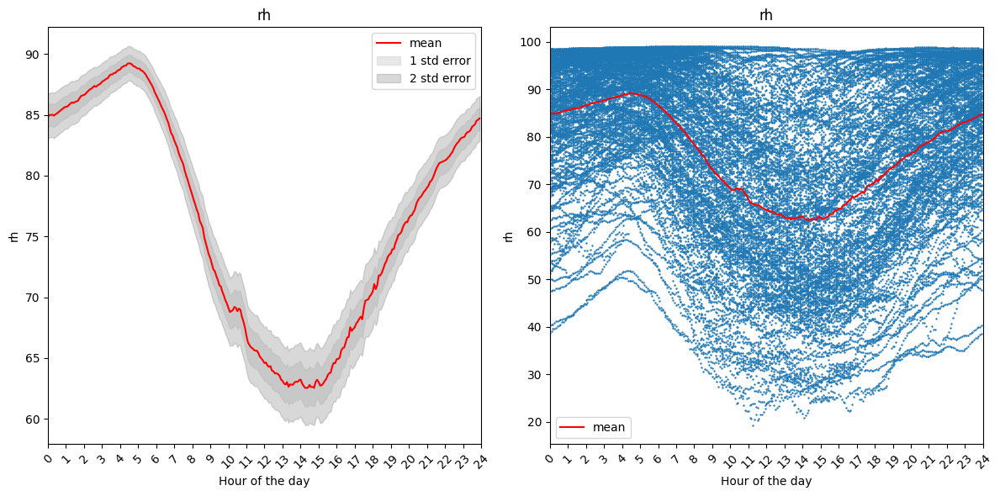

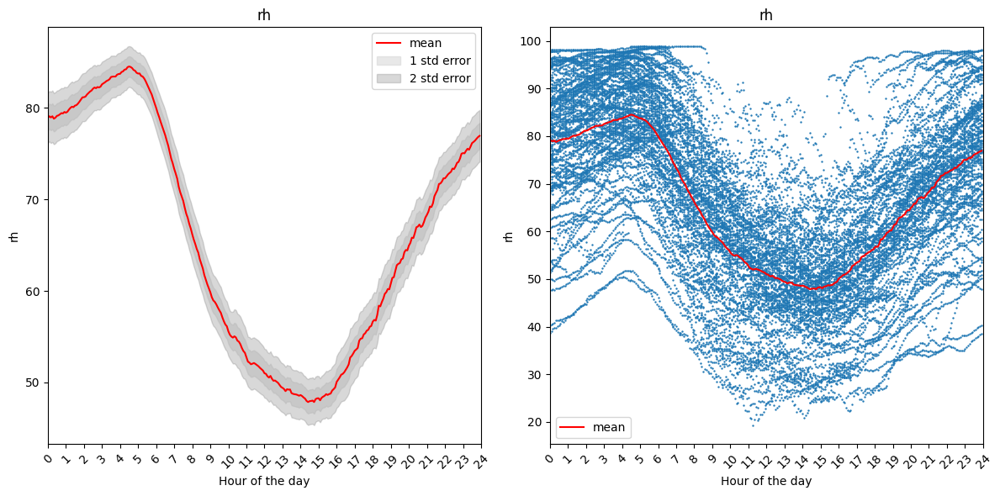

For humidity range from  35 to  79


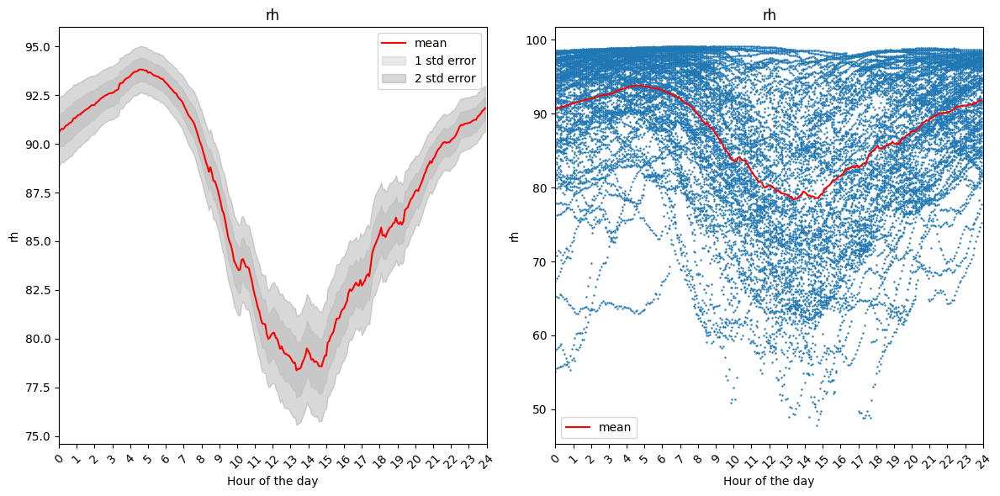

For humidity range from  79 to  98


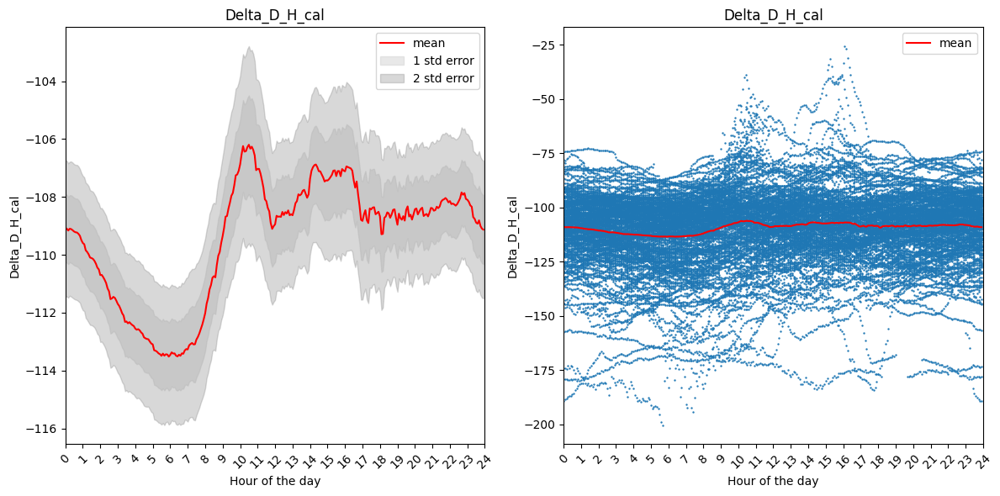

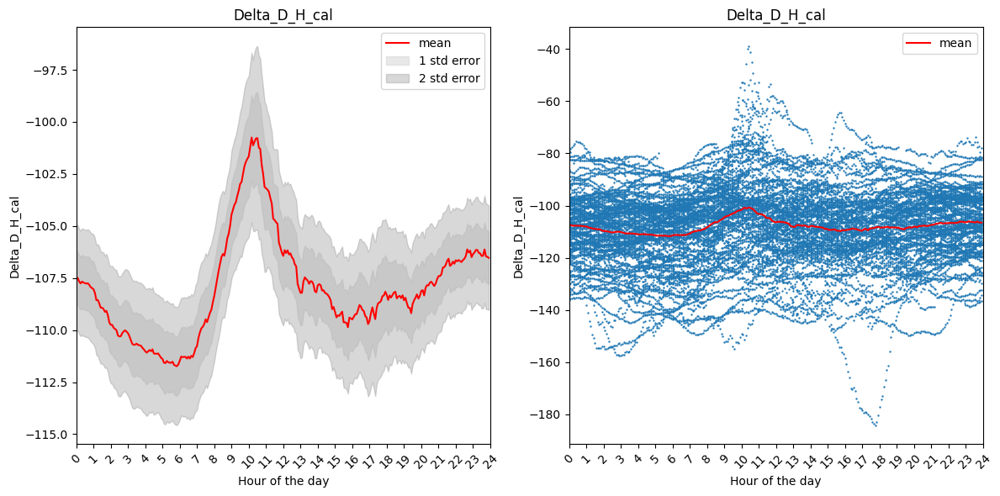

For humidity range from  35 to  79


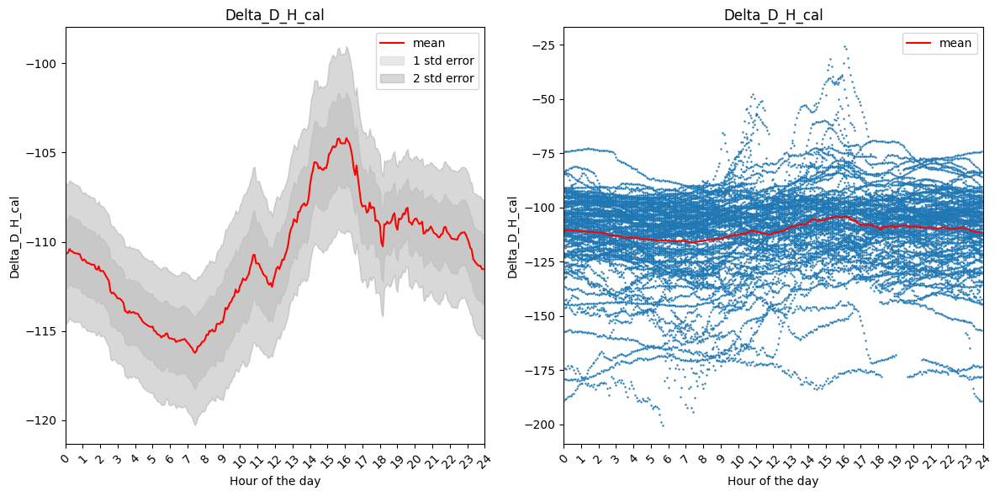

For humidity range from  79 to  98


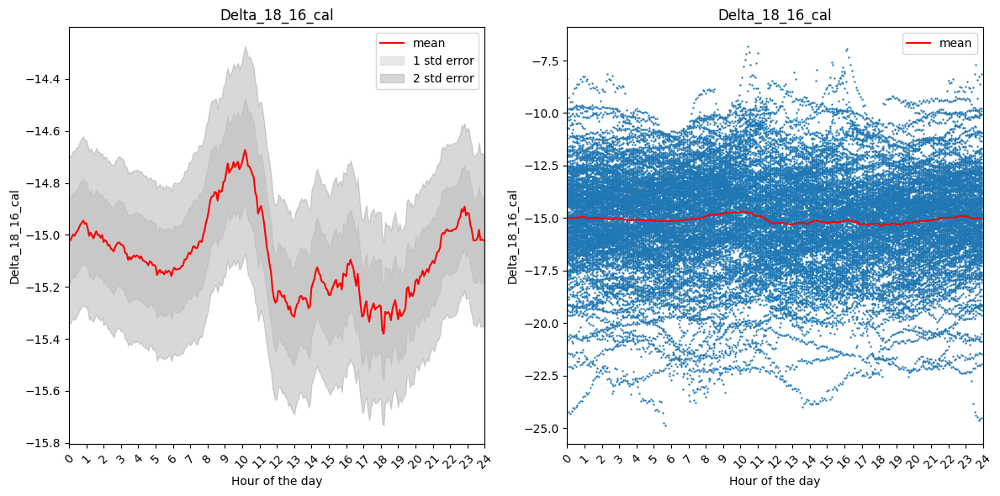

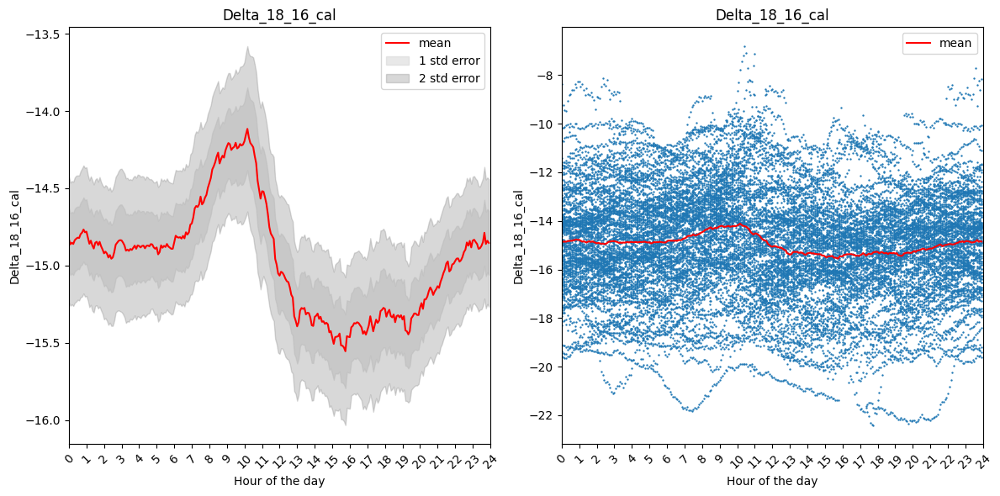

For humidity range from  35 to  79


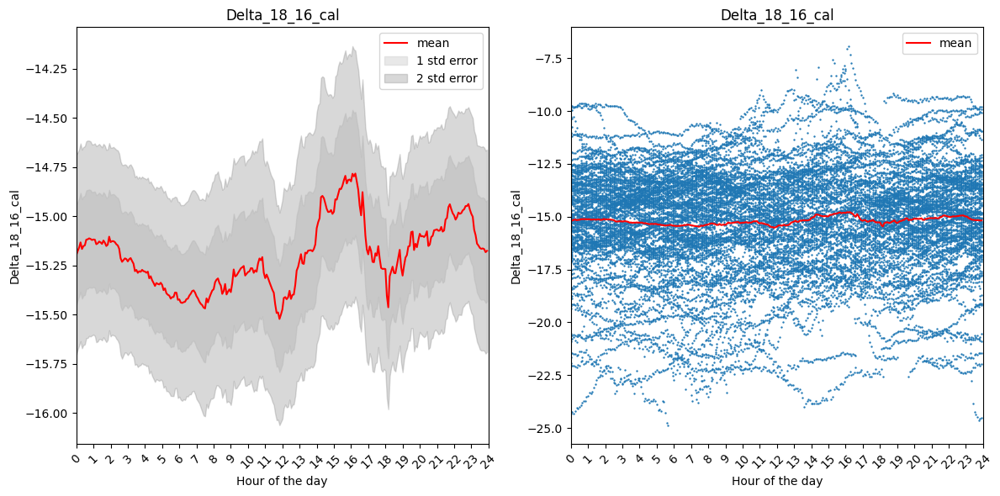

For humidity range from  79 to  98


In [ ]:
# The isotopes that I'm studying
cols = ['rh', 'Delta_D_H_cal', 'Delta_18_16_cal']

# Making a figure for the whole data then a figure for for every slice
for col in cols:
    DailyPlot(col, df =df)
    for x in range(2):
        plot_me = sub_datasets[x] # we have ten slices of humidity from 0 to 9
        #EasyPlot(col, df=plot_me)
        DailyPlot(col, df=plot_me)
        print('For humidity range from ', round(classes.cat.categories[x].left),'to ', round(classes.cat.categories[x].right))

## Temporal slicing: Summer vs Winter

In the next code lines we will consider a comparison between two months

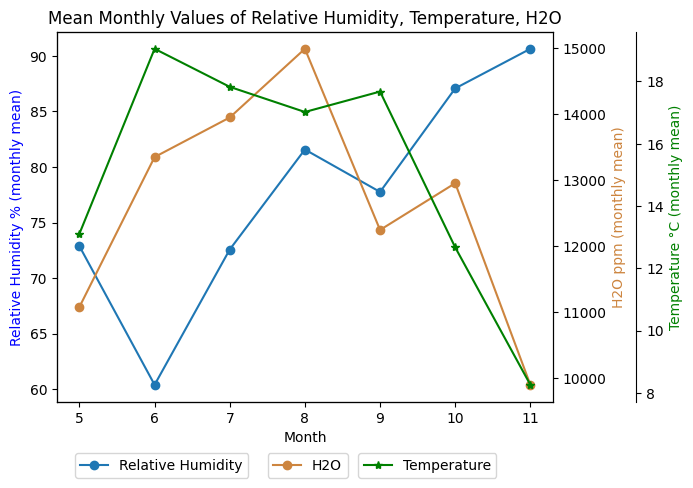

In [ ]:
# Group the dataframe by month and calculate the mean values of 'H2O', 'rh', 'temp'
monthly_mean = df.groupby('month')['H2O', 'rh', 'temp'].mean()

# Create a figure and axis object
fig, ax1 = plt.subplots()

# Plot the mean monthly values of 'rh' and 'temp' as scatter plots with lines
ax1.plot(monthly_mean.index, monthly_mean['rh'], label='Relative Humidity', marker='o', linestyle='-')

# Add labels and title for the primary axis
ax1.set_xlabel('Month')
ax1.set_ylabel('Relative Humidity % (monthly mean)', color ='blue')
ax1.set_title('Mean Monthly Values of Relative Humidity, Temperature, H2O')

# Create a secondary axis for 'H2O'
ax2 = ax1.twinx()

# Plot the mean monthly values of 'H2O' on the secondary axis as scatter plot with lines
ax2.plot(monthly_mean.index, monthly_mean['H2O'], label='H2O', color='peru', marker='o', linestyle='-')

# Create a third axis for 'temp'
ax3 = ax1.twinx()

# Offset the position of the third axis
ax3.spines['right'].set_position(('outward', 60))

# Plot the mean monthly values of 'temp' on the third axis as scatter plot with lines
ax3.plot(monthly_mean.index, monthly_mean['temp'], label='Temperature', color='green', marker='*', linestyle='-')

# Add a legend for all axes
ax1.legend(bbox_to_anchor=(0.4, -0.12))
ax2.legend( bbox_to_anchor=(0.6, -0.12))
ax3.legend(bbox_to_anchor=(0.9, -0.12))

# Add labels for the secondary and third axes
ax2.set_ylabel('H2O ppm (monthly mean)' , color ='peru')
ax3.set_ylabel('Temperature °C (monthly mean)', color ='green')

# Show the plot
plt.show()

The months `May` and `October` are the most extrems.  
NB: there is no enough measurement for whole November

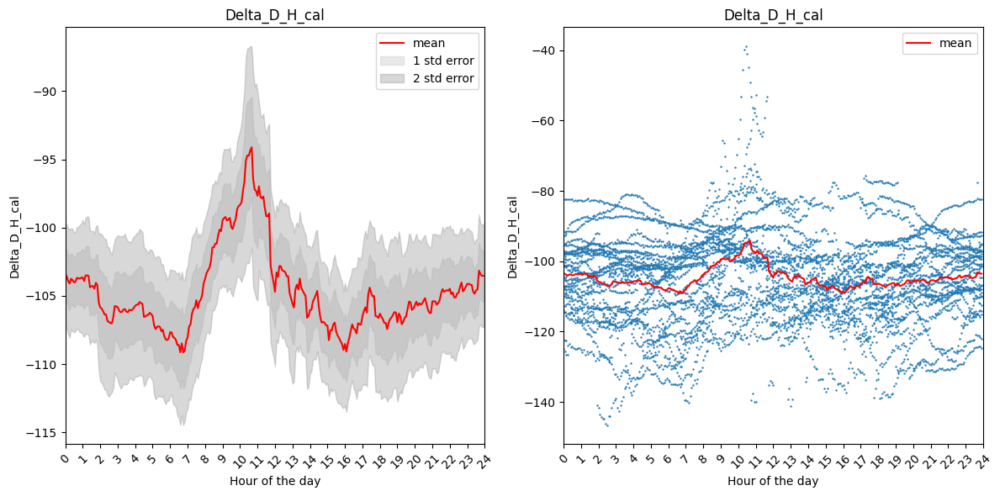

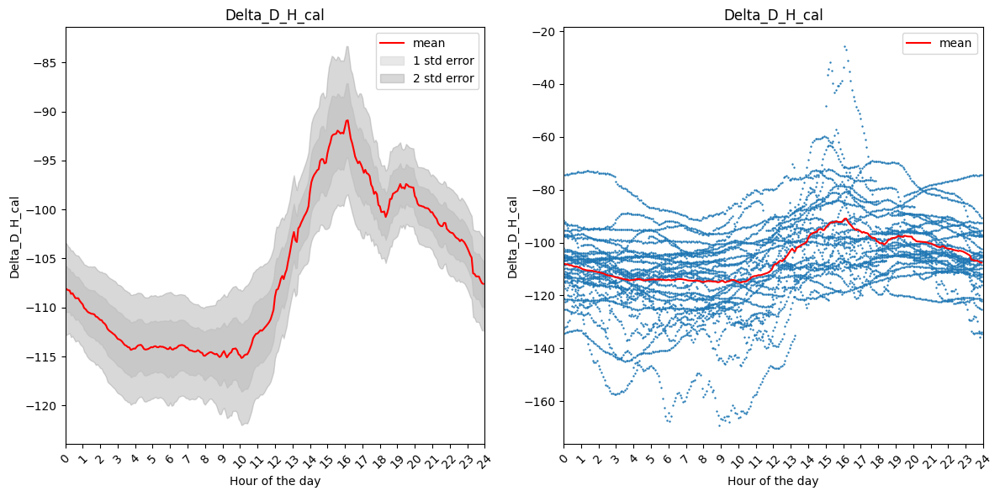

In [ ]:
df_month_5 = df[df['month'] == 5]
DailyPlot(D_H, df= df_month_5)


df_month_10 = df[df['month'] == 10]
DailyPlot(D_H, df= df_month_10)

In [ ]:
golden_ratio = (1 + np.sqrt(5)) / 2

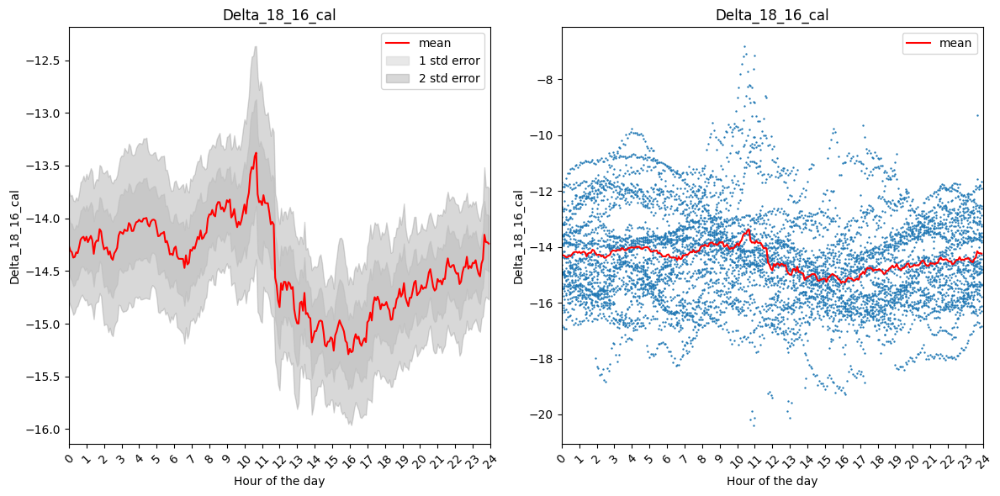

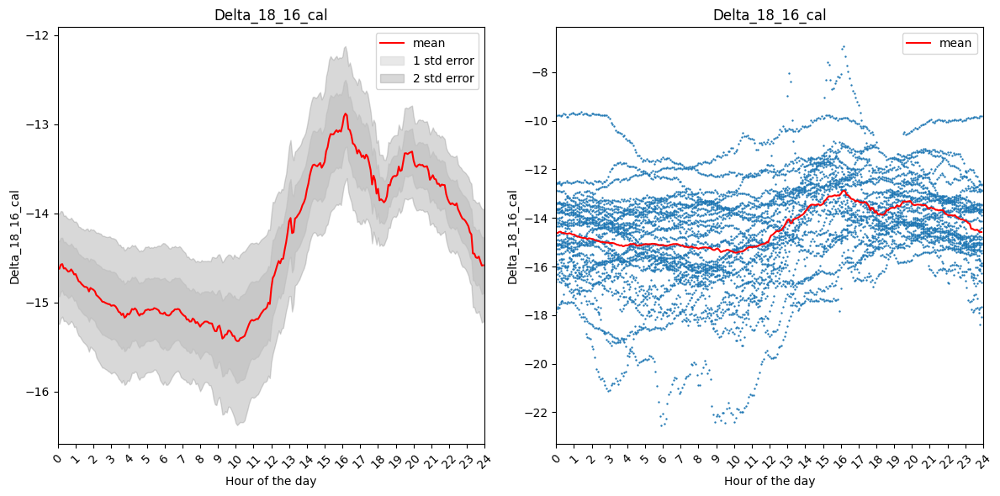

In [ ]:
DailyPlot(O18, df= df_month_5)

DailyPlot(O18, df= df_month_10)

In [ ]:
# Calculate mean and standard error for H2O in May
grouped_H2O_may = df_month_5.groupby('minute_of_day')['H2O'].mean()
std_error_H2O_may = df_month_5.groupby('minute_of_day')['H2O'].std() / np.sqrt(df_month_5.groupby('minute_of_day')['H2O'].count())

# Calculate mean and standard error for H2O in October
grouped_H2O_oct = df_month_10.groupby('minute_of_day')['H2O'].mean()
std_error_H2O_oct = df_month_10.groupby('minute_of_day')['H2O'].std() / np.sqrt(df_month_10.groupby('minute_of_day')['H2O'].count())

# Calculate mean and standard error for Delta_18_16_cal in May
grouped_O18_may = df_month_5.groupby('minute_of_day')['Delta_18_16_cal'].mean()
std_error_O18_may = df_month_5.groupby('minute_of_day')['Delta_18_16_cal'].std() / np.sqrt(df_month_5.groupby('minute_of_day')['Delta_18_16_cal'].count())

# Calculate mean and standard error for Delta_18_16_cal in October
grouped_O18_oct = df_month_10.groupby('minute_of_day')['Delta_18_16_cal'].mean()
std_error_O18_oct = df_month_10.groupby('minute_of_day')['Delta_18_16_cal'].std() / np.sqrt(df_month_10.groupby('minute_of_day')['Delta_18_16_cal'].count())

# Calculate mean and standard error for CDelta_D_cal in May
grouped_CDelta_D_may = df_month_5.groupby('minute_of_day')['CDelta_D_cal'].mean()
std_error_CDelta_D_may = df_month_5.groupby('minute_of_day')['CDelta_D_cal'].std() / np.sqrt(df_month_5.groupby('minute_of_day')['CDelta_D_cal'].count())

# Calculate mean and standard error for Delta_D_H_cal in October
grouped_CDelta_D_oct = df_month_10.groupby('minute_of_day')['CDelta_D_cal'].mean()
std_error_CDelta_D_oct = df_month_10.groupby('minute_of_day')['CDelta_D_cal'].std() / np.sqrt(df_month_10.groupby('minute_of_day')['CDelta_D_cal'].count())


# Calculate mean and standard error for rh in May
grouped_rh_may = df_month_5.groupby('minute_of_day')['rh'].mean()
std_error_rh_may = df_month_5.groupby('minute_of_day')['rh'].std() / np.sqrt(df_month_5.groupby('minute_of_day')['rh'].count())

# Calculate mean and standard error for rh in October
grouped_rh_oct = df_month_10.groupby('minute_of_day')['rh'].mean()
std_error_rh_oct = df_month_10.groupby('minute_of_day')['rh'].std() / np.sqrt(df_month_10.groupby('minute_of_day')['rh'].count())


# Calculate mean and standard error for temp in May
grouped_temp_may = df_month_5.groupby('minute_of_day')['temp'].mean()
std_error_temp_may = df_month_5.groupby('minute_of_day')['temp'].std() / np.sqrt(df_month_5.groupby('minute_of_day')['temp'].count())

# Calculate mean and standard error for temp in October
grouped_temp_oct = df_month_10.groupby('minute_of_day')['temp'].mean()
std_error_temp_oct = df_month_10.groupby('minute_of_day')['temp'].std() / np.sqrt(df_month_10.groupby('minute_of_day')['temp'].count())

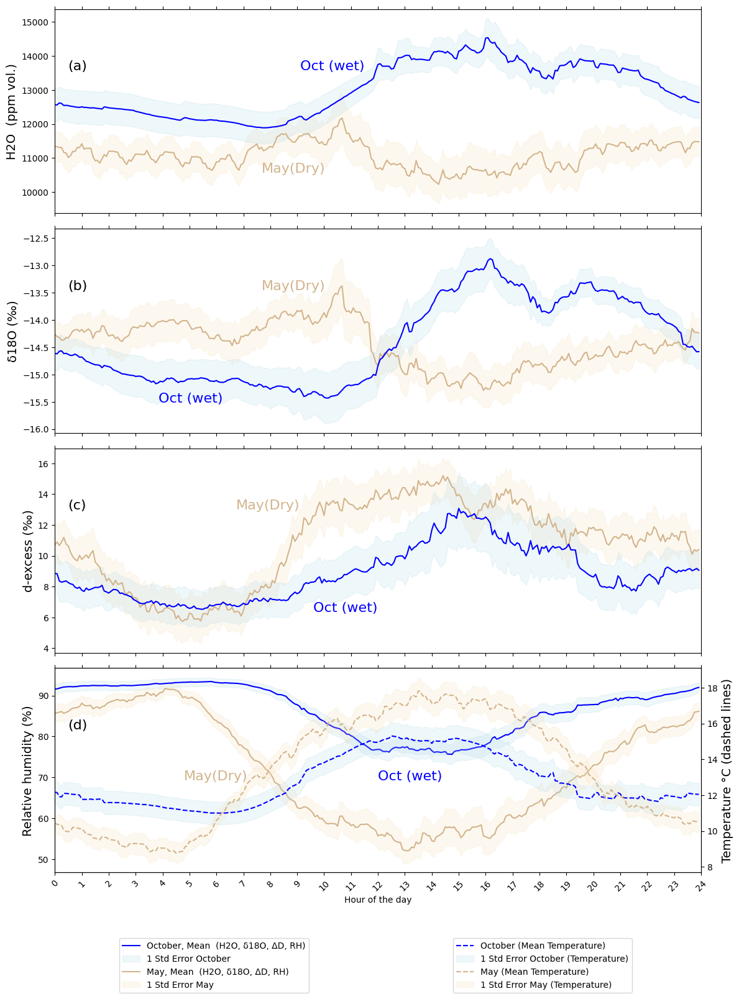

In [ ]:
# Create subplots
fig, axes = plt.subplots(4, 1, figsize=(12,16))

# Plot H2O data for May and October
axes[0].plot(grouped_H2O_may.index, grouped_H2O_may.values, color='tan', label='H2O Mean May (Dry)')
axes[0].fill_between(grouped_H2O_may.index, grouped_H2O_may.values - std_error_H2O_may, grouped_H2O_may.values + std_error_H2O_may, color='wheat', alpha=0.2, label='1 Std Error (May)')
axes[0].plot(grouped_H2O_oct.index, grouped_H2O_oct.values, color='blue', label='H2O Mean October (Wet)')
axes[0].fill_between(grouped_H2O_oct.index, grouped_H2O_oct.values - std_error_H2O_oct, grouped_H2O_oct.values + std_error_H2O_oct, color='lightblue', alpha=0.2, label='1 Std Error (October)')
axes[0].set_ylabel('H2O  (ppm vol.)', fontsize=14)
axes[0].set_xlim(0, 1440)
axes[0].set_xticks(range(0, 1441, 60))
axes[0].set_xticklabels([''] * len(range(0, 25)), rotation=45)
axes[0].text(0.02, 0.75, '(a)', transform=axes[0].transAxes, fontsize=16, va='top', ha='left')
axes[0].text(0.38, 0.75, 'Oct (wet)', transform=axes[0].transAxes, fontsize=16, va='top', ha='left', color='blue')
axes[0].text(0.32, 0.25, 'May(Dry)', transform=axes[0].transAxes, fontsize=16, va='top', ha='left', color='tan')
#axes[0].legend(bbox_to_anchor=(0.1, -4.3))

# Plot Delta_18_16_cal data for May and October
axes[1].plot(grouped_O18_may.index, grouped_O18_may.values, color='tan', label='δ18O Mean May (Dry)')
axes[1].fill_between(grouped_O18_may.index, grouped_O18_may.values - std_error_O18_may, grouped_O18_may.values + std_error_O18_may, color='wheat', alpha=0.2, label='1 Std Error (May, calibrated)')
axes[1].plot(grouped_O18_oct.index, grouped_O18_oct.values, color='blue', label='δ18O Mean October (Wet)')
axes[1].fill_between(grouped_O18_oct.index, grouped_O18_oct.values - std_error_O18_oct, grouped_O18_oct.values + std_error_O18_oct, color='lightblue', alpha=0.2, label='1 Std Error (October, calibrated)')
axes[1].set_ylabel('δ18O (‰)', fontsize=14)
axes[1].set_xlim(0, 1440)
axes[1].set_xticks(range(0, 1441, 60))
axes[1].set_xticklabels([''] * len(range(0, 25)), rotation=45)
axes[1].text(0.02, 0.75, '(b)', transform=axes[1].transAxes, fontsize=16, va='top', ha='left')
axes[1].text(0.16, 0.20, 'Oct (wet)', transform=axes[1].transAxes, fontsize=16, va='top', ha='left', color='blue')
axes[1].text(0.32, 0.75, 'May(Dry)', transform=axes[1].transAxes, fontsize=16, va='top', ha='left', color='tan')
#axes[1].legend(bbox_to_anchor=(0.3, -3.3))

# Plot CDelta_D_cal data for May and October
axes[2].plot(grouped_CDelta_D_may.index, grouped_CDelta_D_may.values, color='tan', label='ΔD Mean May (Dry)')
axes[2].fill_between(grouped_CDelta_D_may.index, grouped_CDelta_D_may.values - std_error_CDelta_D_may, grouped_CDelta_D_may.values + std_error_CDelta_D_may, color='wheat', alpha=0.2, label='1 Std Error (May, calibrated)')
axes[2].plot(grouped_CDelta_D_oct.index, grouped_CDelta_D_oct.values, color='blue', label='ΔD Mean October (Wet)')
axes[2].fill_between(grouped_CDelta_D_oct.index, grouped_CDelta_D_oct.values - std_error_CDelta_D_oct, grouped_CDelta_D_oct.values + std_error_CDelta_D_oct, color='lightblue', alpha=0.2, label='1 Std Error (October, calibrated)')
axes[2].set_ylabel('d-excess (‰)', fontsize=14)
axes[2].set_xlim(0, 1440)
axes[2].set_xticks(range(0, 1441, 60))
axes[2].set_xticklabels([''] * len(range(0, 25)), rotation=45)
axes[2].text(0.02, 0.75, '(c)', transform=axes[2].transAxes, fontsize=16, va='top', ha='left')
axes[2].text(0.40, 0.25, 'Oct (wet)', transform=axes[2].transAxes, fontsize=16, va='top', ha='left', color='blue')
axes[2].text(0.28, 0.75, 'May(Dry)', transform=axes[2].transAxes, fontsize=16, va='top', ha='left', color='tan')
#axes[2].legend(bbox_to_anchor=(0.5, -2.3))


# Plot rh data for May and October
axes[3].plot(grouped_rh_oct.index, grouped_rh_oct.values, color='blue', label='October, Mean  (H2O, δ18O, ΔD, RH)')
axes[3].fill_between(grouped_rh_oct.index, grouped_rh_oct.values - std_error_rh_oct, grouped_rh_oct.values + std_error_rh_oct, color='lightblue', alpha=0.2, label='1 Std Error October')
axes[3].plot(grouped_rh_may.index, grouped_rh_may.values, color='tan', label='May, Mean  (H2O, δ18O, ΔD, RH)')
axes[3].fill_between(grouped_rh_may.index, grouped_rh_may.values - std_error_rh_may, grouped_rh_may.values + std_error_rh_may, color='wheat', alpha=0.2, label='1 Std Error May')
axes[3].set_ylabel('Relative humidity (%)', fontsize=14)
axes[3].set_xlim(0, 1440)
axes[3].set_xticks(range(0, 1441, 60))
axes[3].set_xticklabels(range(0, 25), rotation=45)
axes[3].set_xlabel('Hour of the day')
axes[3].legend(bbox_to_anchor=(0.4, -0.3))
axes[3].text(0.02, 0.75, '(d)', transform=axes[3].transAxes, fontsize=16, va='top', ha='left')
axes[3].text(0.5, 0.50, 'Oct (wet)', transform=axes[3].transAxes, fontsize=16, va='top', ha='left', color='blue')
axes[3].text(0.20, 0.50, 'May(Dry)', transform=axes[3].transAxes, fontsize=16, va='top', ha='left', color='tan')

# Add x axis ticks to the upper part of every figure
for ax in axes:
    ax.tick_params(axis='x', which='both', top=True)

#Add secondary y-axis for temperature
axes_temp = axes[3].twinx()
#axes_temp.invert_yaxis()

axes_temp.plot(grouped_temp_oct.index, grouped_temp_oct.values, color='blue', linestyle='--', label='October (Mean Temperature)')
axes_temp.fill_between(grouped_temp_oct.index, grouped_temp_oct.values - std_error_temp_oct, grouped_temp_oct.values + std_error_temp_oct, color='lightblue', alpha=0.2, label='1 Std Error October (Temperature)')
axes_temp.plot(grouped_temp_may.index, grouped_temp_may.values, color='tan', linestyle='--', label='May (Mean Temperature)')
axes_temp.fill_between(grouped_temp_may.index, grouped_temp_may.values - std_error_temp_may, grouped_temp_may.values + std_error_temp_may, color='wheat', alpha=0.2, label='1 Std Error May (Temperature)')
axes_temp.set_ylabel('Temperature °C (dashed lines)', fontsize=14)
axes_temp.legend(bbox_to_anchor=(0.9, -0.3))

plt.tight_layout()
plt.show()

## Wind direction slicing: from continent or from sea

In [ ]:
degree =135 # We suppose that all wind with direction smaller than this number is originated from land

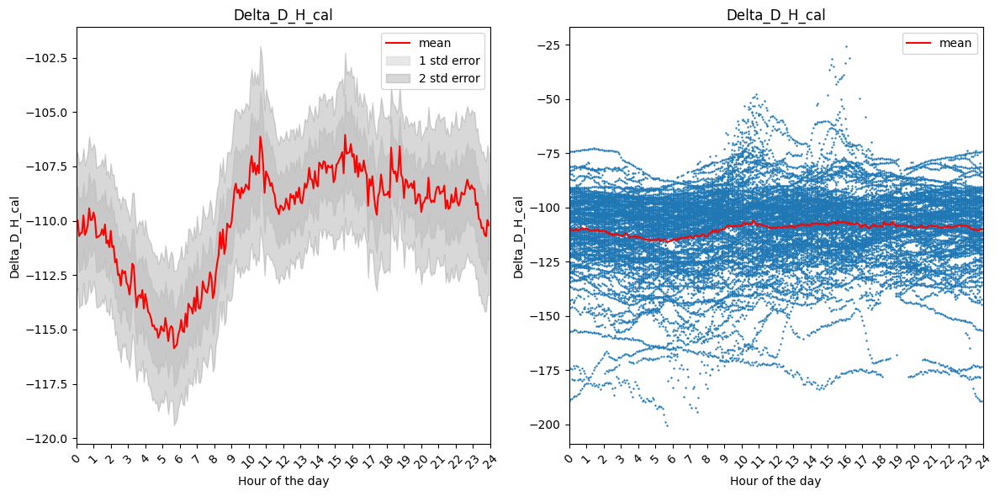

average D_H for measurements with wind from sea is -110.12


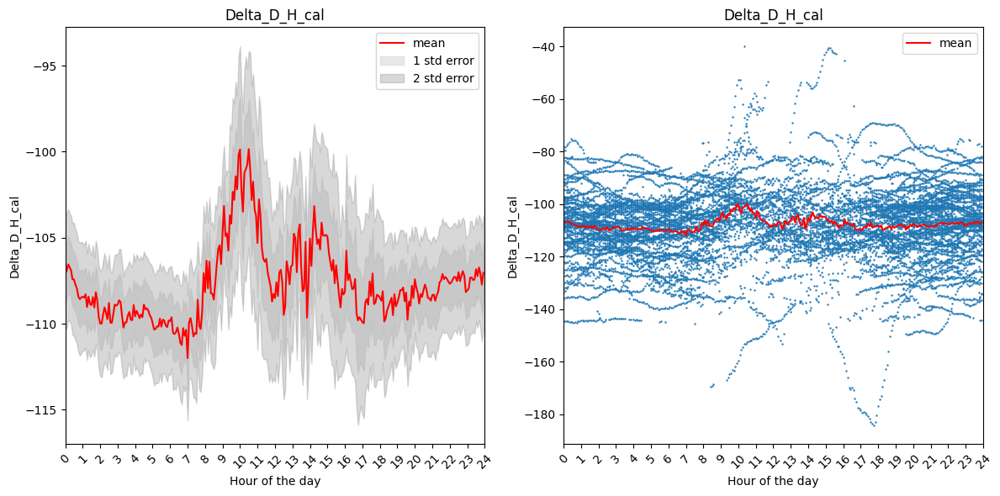

average D_H for measurements with wind from land is -107.94


In [ ]:
df_sea = df[(df['wd'] >= degree) & (df['ws'] > 1.5)]

DailyPlot(D_H, df=df_sea)
print('average D_H for measurements with wind from sea is', round(df_sea[D_H].mean(), 2))

df_land = df[(df['wd'] <= degree) & (df['ws'] > 1.5)]

DailyPlot(D_H, df=df_land)
print('average D_H for measurements with wind from land is', round(df_land[D_H].mean(), 2))

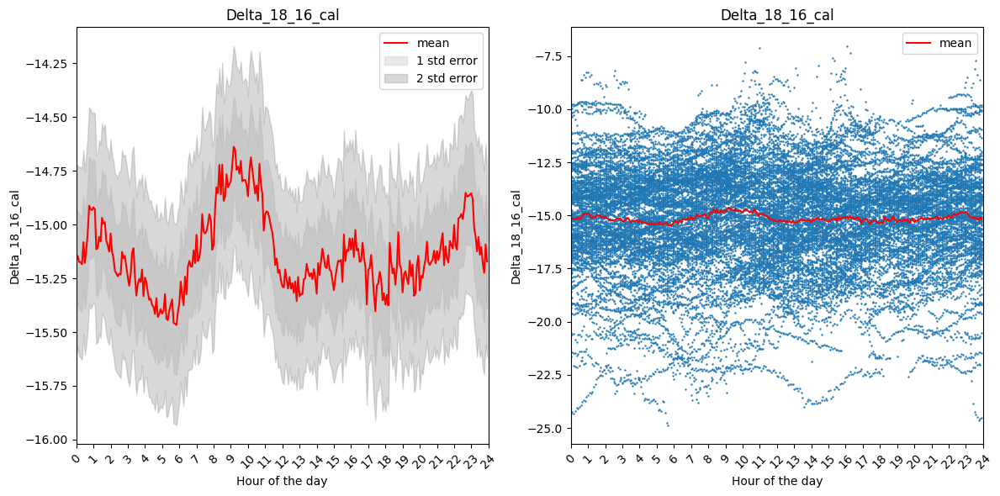

average O18 for measurements with wind from sea is -15.13


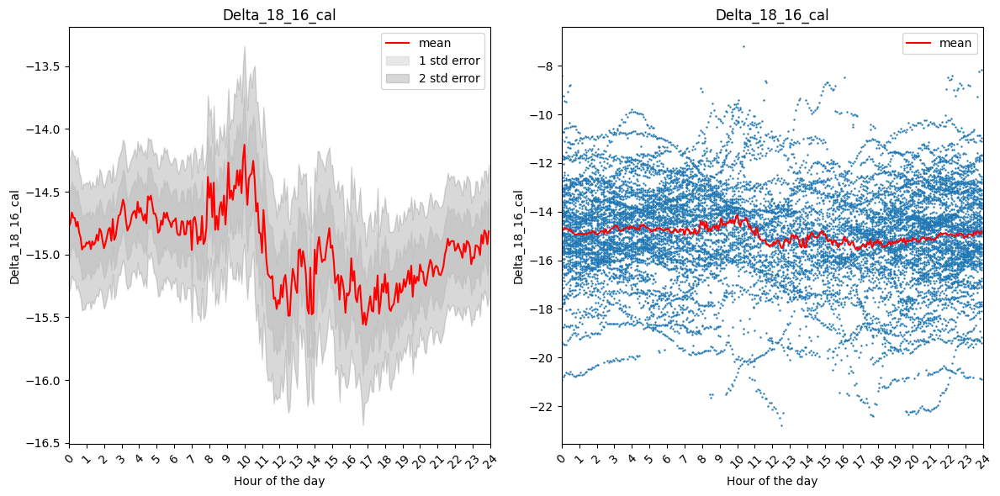

average O18 for measurements with wind from land is -14.94


In [ ]:
df_sea = df[(df['wd'] >= degree) & (df['ws'] > 1.5)]

DailyPlot(O18, df=df_sea)
print('average O18 for measurements with wind from sea is', round(df_sea[O18].mean(), 2))

df_land = df[(df['wd'] <= degree) & (df['ws'] > 1.5)]

DailyPlot(O18, df=df_land)
print('average O18 for measurements with wind from land is', round(df_land[O18].mean(), 2))

# Multivariate Regression Analysis

We found befor that there is a linear correlation between the isotop value ('Delta_D_H_cal') and the data, mailny the values of `H2O` ,`Temp_min_Tdew`,  `temp` , `shortwave_in`, `CO2` , and `rh`.   
Here we will try a multivariante regression analysis.

In [ ]:
# Remove rows with missing values
df1 = df.replace([np.inf, -np.inf], np.nan).dropna()

# Define the dependent variable
y = df1['Delta_D_H_cal']

# Define the independent variables
X = df1[['H2O', 'Temp_min_Tdew', 'temp', 'shortwave_in', 'CO2', 'rh']]

# Add a constant term to the independent variables
X = sm.add_constant(X)

# Fit the multivariate regression model
model = sm.OLS(y, X).fit()

# Print the summary of the regression model
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          Delta_D_H_cal   R-squared:                       0.317
Model:                            OLS   Adj. R-squared:                  0.317
Method:                 Least Squares   F-statistic:                     3961.
Date:                Wed, 24 Jan 2024   Prob (F-statistic):               0.00
Time:                        09:12:53   Log-Likelihood:            -2.0822e+05
No. Observations:               51293   AIC:                         4.165e+05
Df Residuals:                   51286   BIC:                         4.165e+05
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const          -113.0473      2.088    -54.146      0.000    -117.139    -108.955
H2O               0.0029   2.04e-05    144.247      0.000       0.003       0.003
Temp_min_Tdew     0.6386      0.084      7.628      0.000       0.475       0.803
temp             -0.4548      0.017    -26.144      0.000      -0.489      -0.421
shortwave_in     -0.0013      0.000     -3.934      0.000      -0.002      -0.001
CO2              -0.0662      0.002    -27.353      0.000      -0.071      -0.061
rh               -0.0087      0.020     -0.438      0.661      -0.047       0.030
==============================================================================
Omnibus:                     6207.906   Durbin-Watson:                   0.006
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            16557.842
Skew:                          -0.681   Prob(JB):                         0.00
Kurtosis:                       5.428   Cond. No.                     4.44e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.44e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

The Lower p-values can suggest that the variable is statistically significant. In the table above we see that `rh` is insignificant in this analysis. We will omit it in the next attempt.   
The t-value is the coefficient divided by its standard error. It measures how many standard deviations the coefficient is away from zero. Larger absolute t-values generally indicate more significant variables. We see that `rh` has the smallest t-value.  


In [ ]:
# Remove rows with missing values
df1 = df.replace([np.inf, -np.inf], np.nan).dropna()

# Define the dependent variable
y = df1['Delta_D_H_cal']

# Define the independent variables
X = df1[['H2O', 'Temp_min_Tdew', 'temp', 'shortwave_in', 'CO2']]

# Add a constant term to the independent variables
X = sm.add_constant(X)

# Fit the multivariate regression model
model = sm.OLS(y, X).fit()

# Print the summary of the regression model
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          Delta_D_H_cal   R-squared:                       0.317
Model:                            OLS   Adj. R-squared:                  0.317
Method:                 Least Squares   F-statistic:                     4753.
Date:                Wed, 24 Jan 2024   Prob (F-statistic):               0.00
Time:                        09:12:53   Log-Likelihood:            -2.0822e+05
No. Observations:               51293   AIC:                         4.165e+05
Df Residuals:                   51287   BIC:                         4.165e+05
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const          -113.8258      1.095   -103.968      0.000    -115.972    -111.680
H2O               0.0029   2.04e-05    144.822      0.000       0.003       0.003
Temp_min_Tdew     0.6738      0.024     28.156      0.000       0.627       0.721
temp             -0.4549      0.017    -26.156      0.000      -0.489      -0.421
shortwave_in     -0.0013      0.000     -3.929      0.000      -0.002      -0.001
CO2              -0.0664      0.002    -27.618      0.000      -0.071      -0.062
==============================================================================
Omnibus:                     6206.845   Durbin-Watson:                   0.006
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            16548.924
Skew:                          -0.681   Prob(JB):                         0.00
Kurtosis:                       5.427   Cond. No.                     2.33e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.33e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [ ]:
# Get the predicted values from the model
y_pred = model.predict(X)

# Calculate the mean squared error
mse = mean_squared_error(y, y_pred)

mse

196.5925287777524

Both models have the same R-squared value, indicating that they explain about the same amount of variance in the dependent variable. However, the updated model has a higher F-statistic, which suggests a better overall fit.

Visualizing the model performance

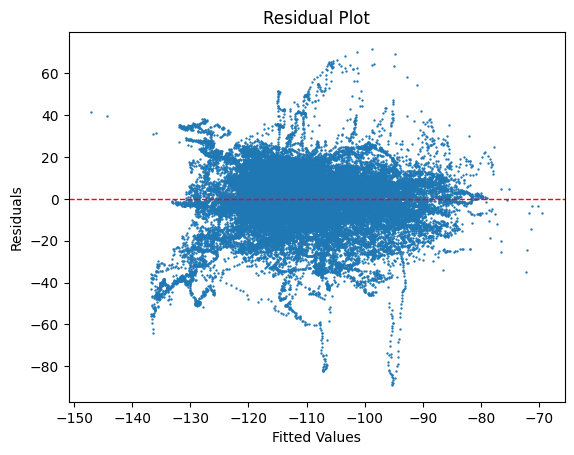

In [ ]:
# Calculate residuals
residuals = model.resid

# Create a residual plot
plt.scatter(model.fittedvalues, residuals, s=0.5)
plt.axhline(y=0, color='red', linestyle='--', linewidth=1)
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.show()


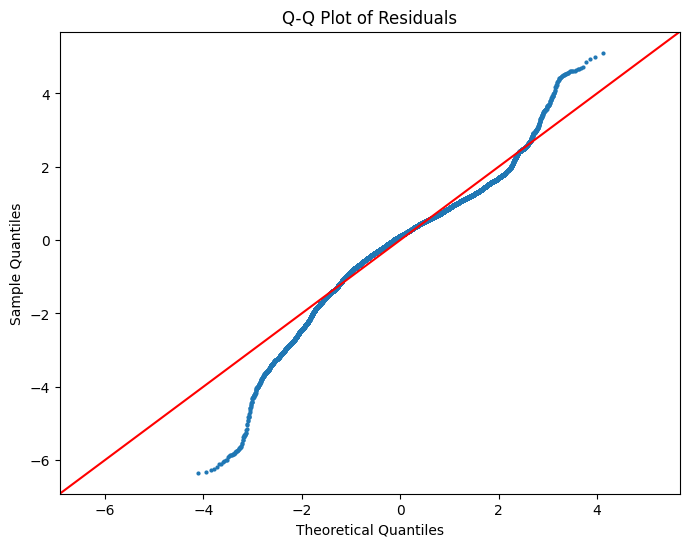

In [ ]:
# Create Q-Q plot
fig, ax = plt.subplots(figsize=(8, 6))
sm.qqplot(residuals, line='45', fit=True, markersize=2, ax=ax)
plt.title('Q-Q Plot of Residuals')
plt.show()

The Q-Q Plot (Quantile-Quantile Plot) can help you assess the normality of residuals. If your residuals follow a straight line, it indicates normal distribution.

Our data is stright inside the quantiles of [-2, 2]. It is not normally distributed beyond that quantiles.

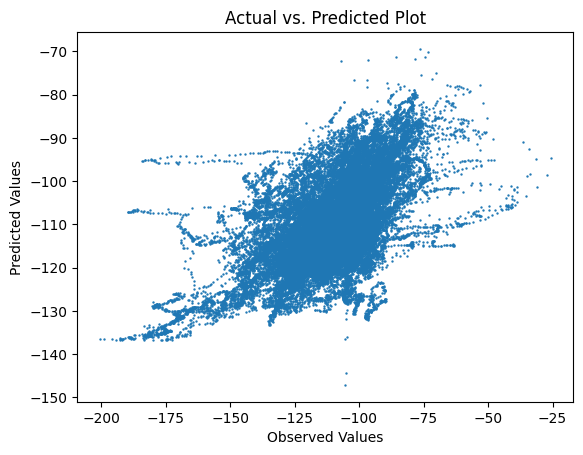

In [ ]:
plt.scatter(y, model.fittedvalues, s =0.5)
plt.xlabel('Observed Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs. Predicted Plot')
plt.show()


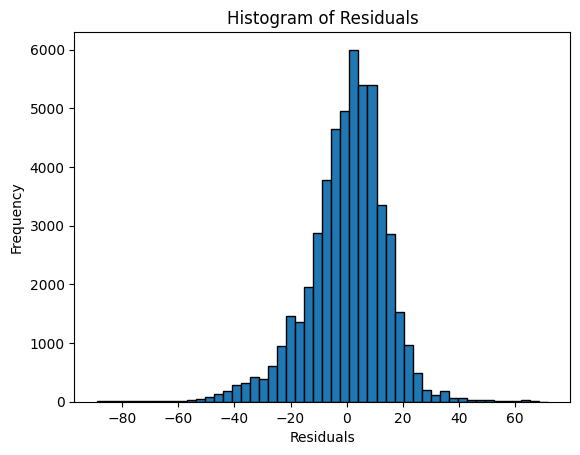

In [ ]:
plt.hist(residuals, bins=50, edgecolor='black')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.title('Histogram of Residuals')
plt.show()


# Random Forest Regression

In [ ]:

# Define the independent variables
X = df1[['H2O', 'Temp_min_Tdew', 'temp', 'shortwave_in', 'CO2']]

# Define the dependent variable
y = df1['Delta_D_H_cal']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create the random forest model
model = RandomForestRegressor()

# Fit the model to the training data
model.fit(X_train, y_train)

# Make predictions on the testing data
predictions = model.predict(X_test)

# Calculate the mean squared error
mse = mean_squared_error(y_test, predictions)

# Print the mean squared error
mse

21.716576848366355

The `mse` value is far better than the Multivariate Regression Analysis.

In [ ]:
# Get the number of trees in the random forest model
num_trees = model.n_estimators

num_trees

100

Random Forests are generally robust to outliers or extreme values

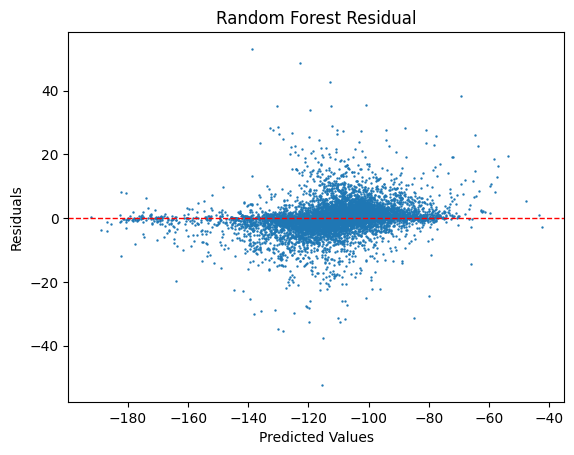

In [ ]:
residuals_rf = y_test - predictions

plt.scatter(predictions, residuals_rf, s =0.5)
plt.axhline(y=0, color='red', linestyle='--', linewidth=1)
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Random Forest Residual')
plt.show()

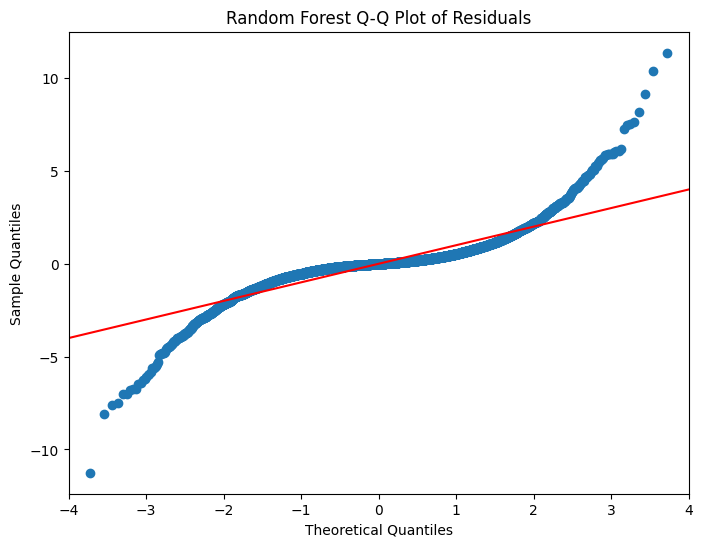

In [ ]:
fig, ax = plt.subplots(figsize=(8, 6))
sm.qqplot(residuals_rf, line='45', fit=True, ax=ax)
plt.title('Random Forest Q-Q Plot of Residuals')
plt.xlim(-4, 4)
plt.show()

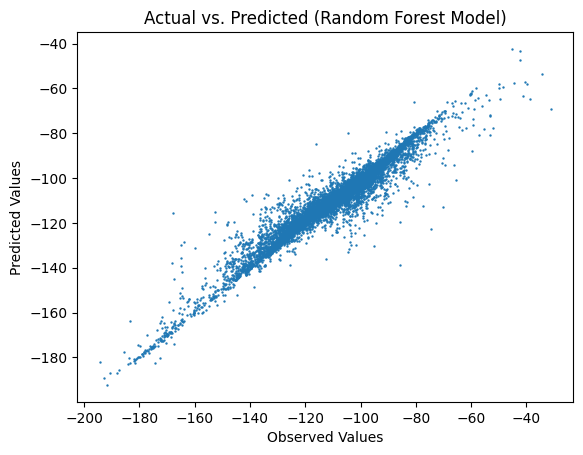

In [ ]:
# Visualize the performance of the random forest model
plt.scatter(y_test, predictions, s=0.5)
plt.xlabel('Observed Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs. Predicted (Random Forest Model)')
plt.show()

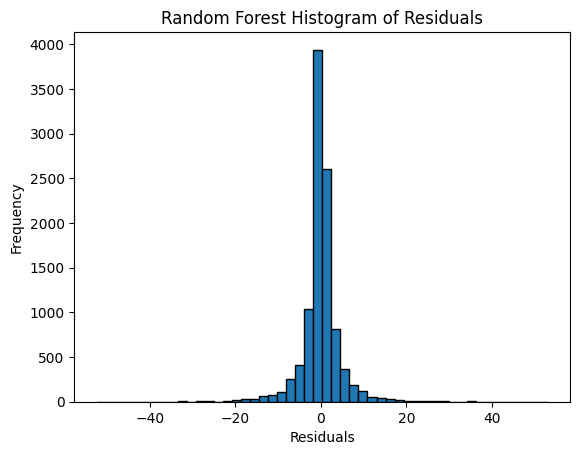

In [ ]:
plt.hist(residuals_rf, bins=50, edgecolor='black')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.title('Random Forest Histogram of Residuals')
plt.show()


In [ ]:
# Create a random forest regressor object
rf_model = RandomForestRegressor()

# Fit the model to the training data
rf_model.fit(X_train, y_train)

# Get the number of trees in the random forest model
num_trees = rf_model.n_estimators

num_trees

100

Random Forests inherently capture complex relationships in the data, but they might lack the interpretability of linear models. However, we can gain insights by examining feature importances.  
Feature importance tells you which variables contribute the most to the predictive accuracy of the model.

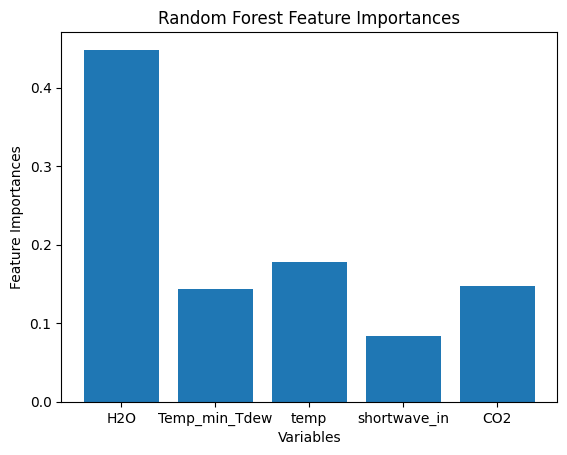

In [ ]:
# Access feature importances from the trained Random Forest model
feature_importances = model.feature_importances_

# Create a bar plot to visualize feature importances
plt.bar(X.columns, feature_importances)
plt.xlabel('Variables')
plt.ylabel('Feature Importances')
plt.title('Random Forest Feature Importances')
plt.show()


# Daily range fluctuation

Check Data daily range fluctuation

In [ ]:
grouped_by_day = df.groupby(df['day_of_year'])['Delta_D_H_cal']
daily_D_range = grouped_by_day.max() - grouped_by_day.min()
len(daily_D_range)

205

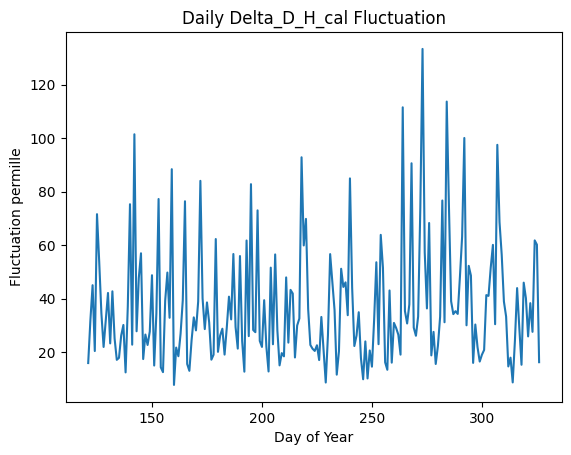

In [ ]:
# Create a plot for the daily Delta_D_H_cal fluctuation
plt.plot(daily_D_range)
plt.xlabel('Day of Year')
plt.ylabel('Fluctuation permille')
plt.title('Daily Delta_D_H_cal Fluctuation')
plt.show()

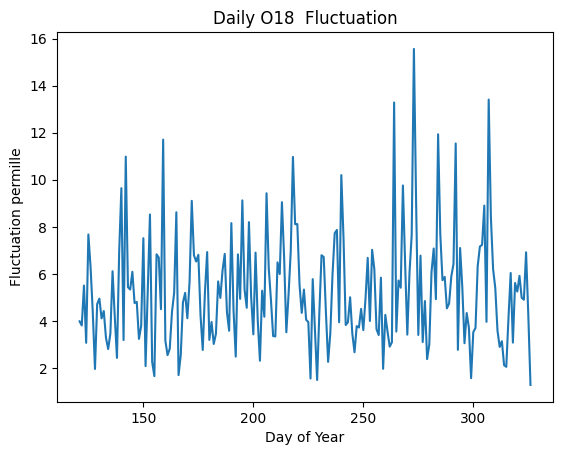

In [ ]:
grouped_by_day = df.groupby(df['day_of_year'])[O18]
daily_O_range = grouped_by_day.max() - grouped_by_day.min()

plt.plot(daily_O_range)
plt.xlabel('Day of Year')
plt.ylabel('Fluctuation permille')
plt.title('Daily O18  Fluctuation')
plt.show()

## Removing non-daily fluctuation

We will invistigate in the next lines whether removing non daily fluctuation can improve our understanding of the data daily fluctuation

Text(0, 0.5, 'Fluctuation permille')

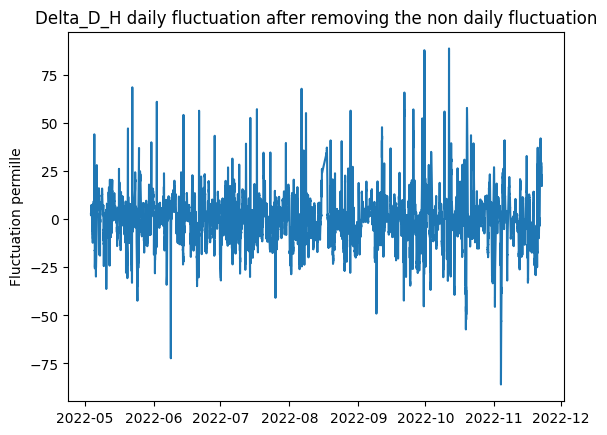

In [ ]:
# make a column with the daily signal removed from the data by running a moving average of 288 points
df['Delta_D_H_cal_no_daily'] = df['Delta_D_H_cal'].rolling(window=288).mean()

# make a new data column for only daily oscillation
df['Delta_D_H_cal_only_daily'] = df['Delta_D_H_cal'] - df['Delta_D_H_cal_no_daily']

plt.plot(df['Delta_D_H_cal_only_daily'])
plt.title('Delta_D_H daily fluctuation after removing the non daily fluctuation')
plt.ylabel('Fluctuation permille')

Text(0, 0.5, 'Fluctuation permille')

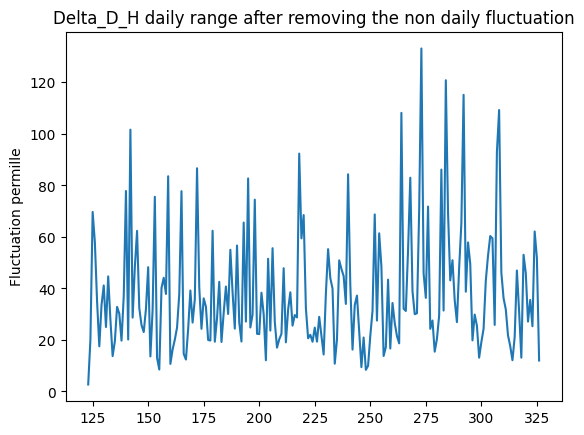

In [ ]:
# ploting the daily range after removing the non daily fluctuation
grouped_by_day = df.groupby(df['day_of_year'])['Delta_D_H_cal_only_daily']
daily_D_range = grouped_by_day.max() - grouped_by_day.min()

plt.plot(daily_D_range)
plt.title('Delta_D_H daily range after removing the non daily fluctuation')
plt.ylabel('Fluctuation permille')

There were no big difference after removing the non daily fluctuation   
I also examined the correlation between the range data and the water; however, the findings were not significant. Therefore, I will exclude this part from further analysis.

# The derivative

We want to find the diurnal cycle or namely : when the value raise or fall? Then the best approach is to take the derivative of the value. This is better than the raw value because the raw value oscillation range is bigger than the daily oscillation which can masker the signal.  


In [ ]:
# Calculate the derivative of 'Delta_D_H_cal'
df['Delta_D_H_cal_derivative'] = df['Delta_D_H_cal'].diff()

# Display the updated dataframe
#df.head()

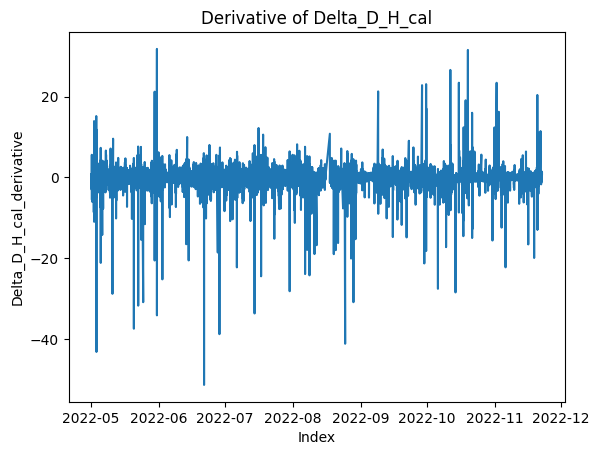

In [ ]:
# Plot the derivative of 'Delta_D_H_cal'
plt.plot(df['Delta_D_H_cal_derivative'])
plt.xlabel('Index')
plt.ylabel('Delta_D_H_cal_derivative')
plt.title('Derivative of Delta_D_H_cal')
plt.show()

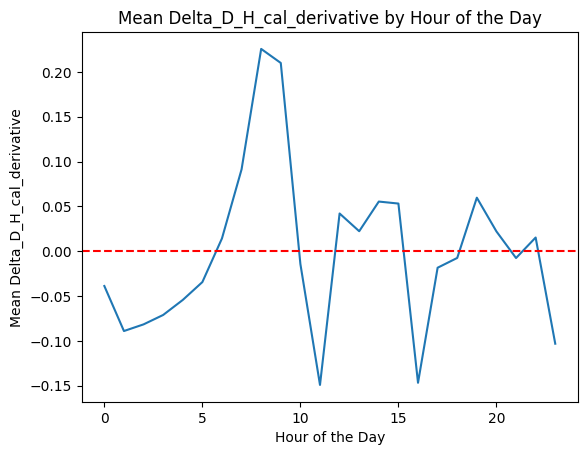

In [ ]:
# Group data by the hour of the day
grouped_data = df.groupby('hour')['Delta_D_H_cal_derivative'].mean()

# Plot the grouped data
plt.plot(grouped_data.index, grouped_data.values)
plt.axhline(0, linestyle='dashed', color='red')
plt.xlabel('Hour of the Day')
plt.ylabel('Mean Delta_D_H_cal_derivative')
plt.title('Mean Delta_D_H_cal_derivative by Hour of the Day')
plt.show()

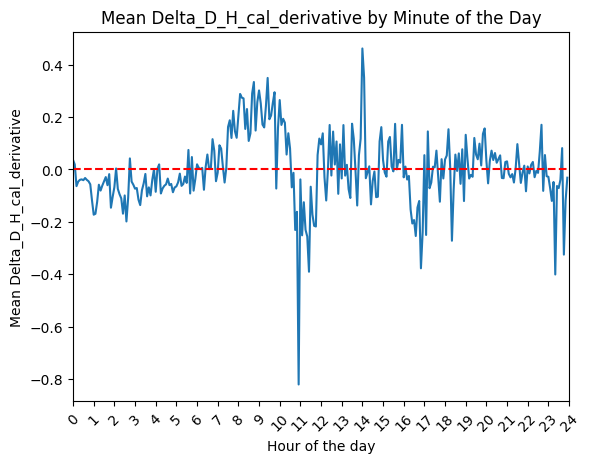

In [ ]:
# Group data by the minute of the day
grouped_data = df.groupby('minute_of_day')['Delta_D_H_cal_derivative'].mean()

# Plot the grouped data
plt.plot(grouped_data.index, grouped_data.values)
plt.axhline(0, linestyle='dashed', color='red')
plt.xticks(range(0, 1441, 60), range(0, 25), rotation=45)
plt.xlabel('Hour of the day')
plt.ylabel('Mean Delta_D_H_cal_derivative')
plt.xlim(0, 1440)
plt.title('Mean Delta_D_H_cal_derivative by Minute of the Day')
plt.show()

In [ ]:
# Calculate the derivative of 'Delta_D_H_cal'
df['Delta_18_16_cal_derivative'] = df['Delta_18_16_cal'].diff()

# Display the updated dataframe
#df.head()

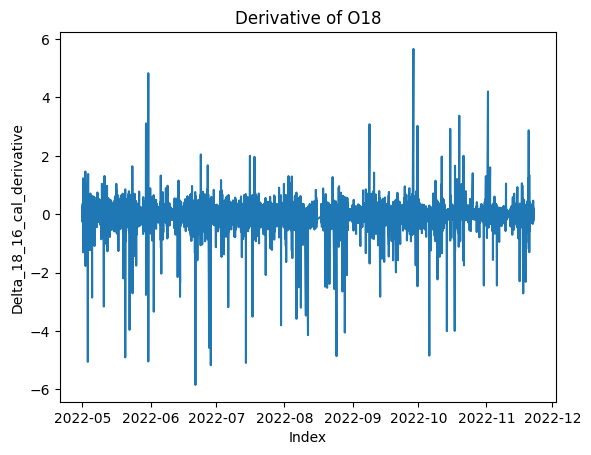

In [ ]:
# Plot the derivative of 'Delta_D_H_cal'
plt.plot(df['Delta_18_16_cal_derivative'])
plt.xlabel('Index')
plt.ylabel('Delta_18_16_cal_derivative')
plt.title('Derivative of O18')
plt.show()

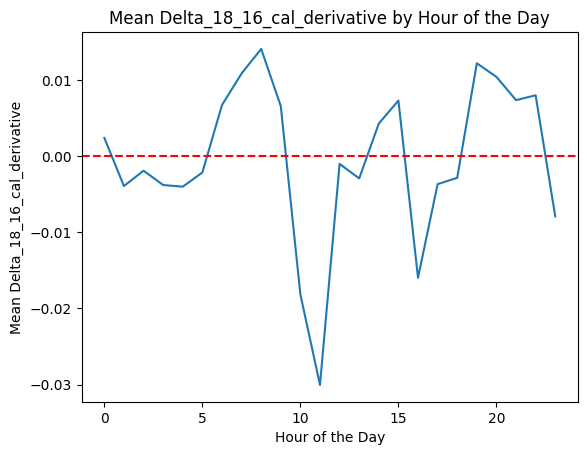

In [ ]:
# Group data by the hour of the day
grouped_data = df.groupby('hour')['Delta_18_16_cal_derivative'].mean()

# Plot the grouped data
plt.plot(grouped_data.index, grouped_data.values)
plt.axhline(0, linestyle='dashed', color='red')
plt.xlabel('Hour of the Day')
plt.ylabel('Mean Delta_18_16_cal_derivative')
plt.title('Mean Delta_18_16_cal_derivative by Hour of the Day')
plt.show()

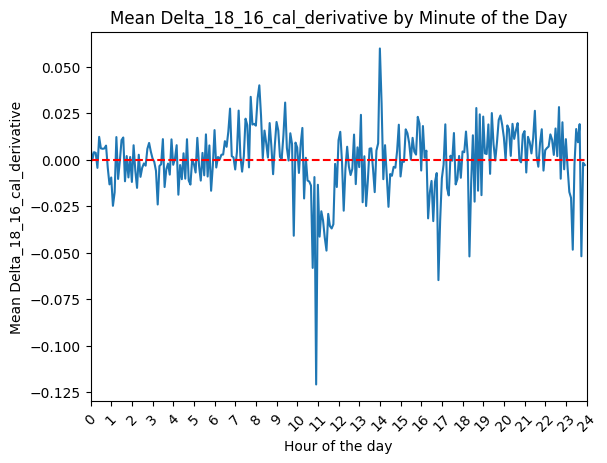

In [ ]:
# Group data by the minute of the day
grouped_data = df.groupby('minute_of_day')['Delta_18_16_cal_derivative'].mean()

# Plot the grouped data
plt.plot(grouped_data.index, grouped_data.values)
plt.axhline(0, linestyle='dashed', color='red')
plt.xticks(range(0, 1441, 60), range(0, 25), rotation=45)
plt.xlabel('Hour of the day')
plt.ylabel('Mean Delta_18_16_cal_derivative')
plt.xlim(0, 1440)
plt.title('Mean Delta_18_16_cal_derivative by Minute of the Day')
plt.show()